In [ ]:
# libraries
#%matplotlib notebook
import os
import pandas as pd
import numpy as np
import json
from scipy.signal import periodogram
from sklearn.metrics import confusion_matrix, average_precision_score
import matplotlib
import seaborn
import matplotlib.dates as md
from matplotlib import pyplot as plt
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
dfsA1 = {}

# Loop through the range 1 to 67 (inclusive) and load data
for i in range(1, 68):
    file_path = f"/content/drive/My Drive/YAHOO/A1/Yahoo_A1real_{i}_data.out"
    dfsA1[i] = pd.read_csv(file_path, sep=",", names=[f"value_{i}", "label"])
    # Add a timestamp column assuming hourly data starting from '2022-01-01 00:00:00'
    start_time = pd.Timestamp('2022-01-01 00:00:00')
    dfsA1[i]['timestamp'] = [start_time + pd.Timedelta(hours=i) for i in range(len(dfsA1[i]))]

    # Set timestamp as the index for time-series processing
    dfsA1[i].set_index('timestamp', inplace=True)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Perform feature engineering
def feature_engineering(df, value_col, window_size):
    df = df.copy()

    # Rolling statistics
    df[f'rolling_mean_{window_size}'] = df[value_col].rolling(window=window_size).mean()
    df[f'rolling_std_{window_size}'] = df[value_col].rolling(window=window_size).std()
    df[f'rolling_min_{window_size}'] = df[value_col].rolling(window=window_size).min()
    df[f'rolling_max_{window_size}'] = df[value_col].rolling(window=window_size).max()

    # Time-based features
    df['hour'] = df.index.hour
    df['day_of_week'] = df.index.dayofweek
    df['day_of_month'] = df.index.day
    df['month'] = df.index.month
    df['Lag'] = df[value_col].shift(24)

    # Sinusoidal encoding for seasonality
    df['sin_day'] = np.sin(2 * np.pi * df.index.dayofyear / 24)
    df['cos_day'] = np.cos(2 * np.pi * df.index.dayofyear / 24)

    # Drop rows with NaN due to rolling statistics
    df.dropna(inplace=True)
    return df

## A1A - Long term Stationarity with weak seasonality




## Isolation Forest with temporal columns

Processing dataset dfsA1[1]...
Best F1 Score for dfsA1[1]: 0.2500
Best Precision: 0.1429
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


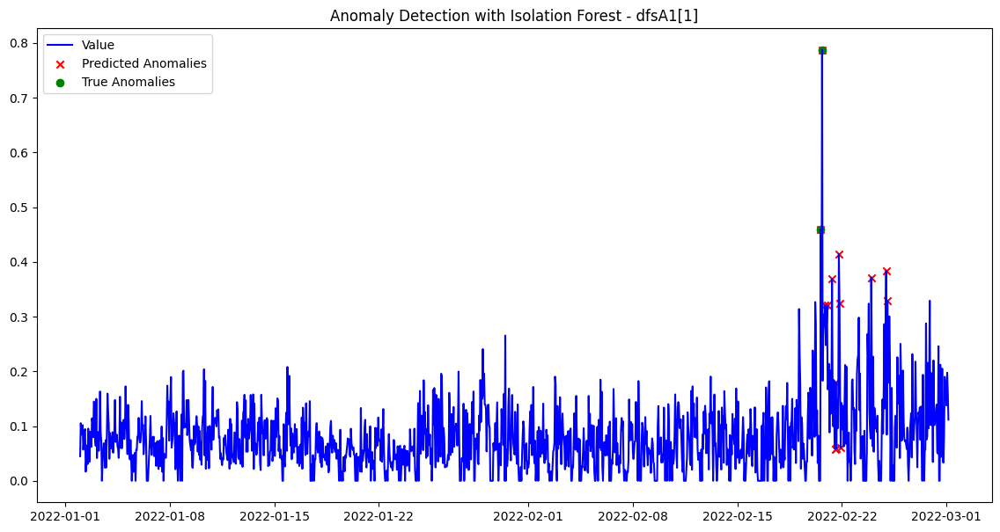

Processing dataset dfsA1[2]...
Best F1 Score for dfsA1[2]: 0.9677
Best Precision: 1.0000
Best Recall: 0.9375
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 0.5, 'n_estimators': 50, 'random_state': 42}


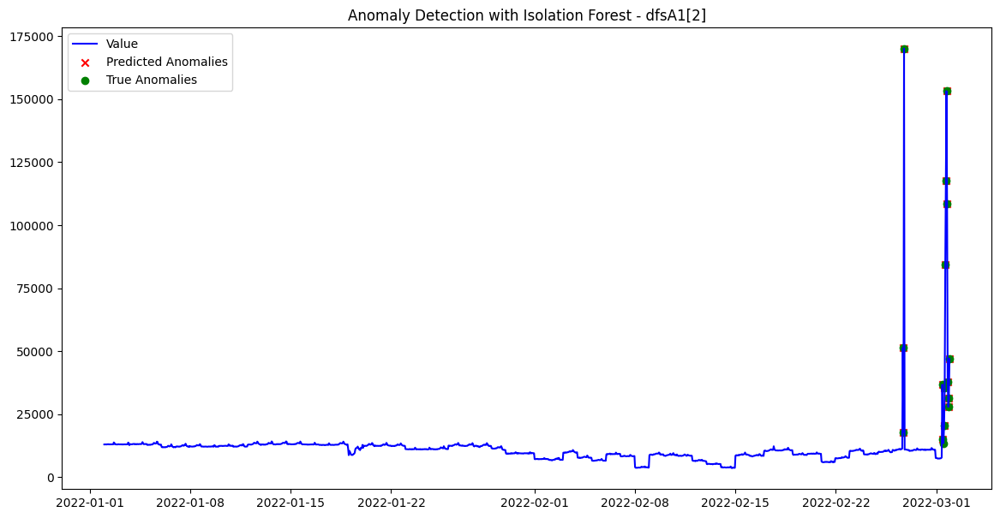

Processing dataset dfsA1[3]...
Best F1 Score for dfsA1[3]: 1.0000
Best Precision: 1.0000
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


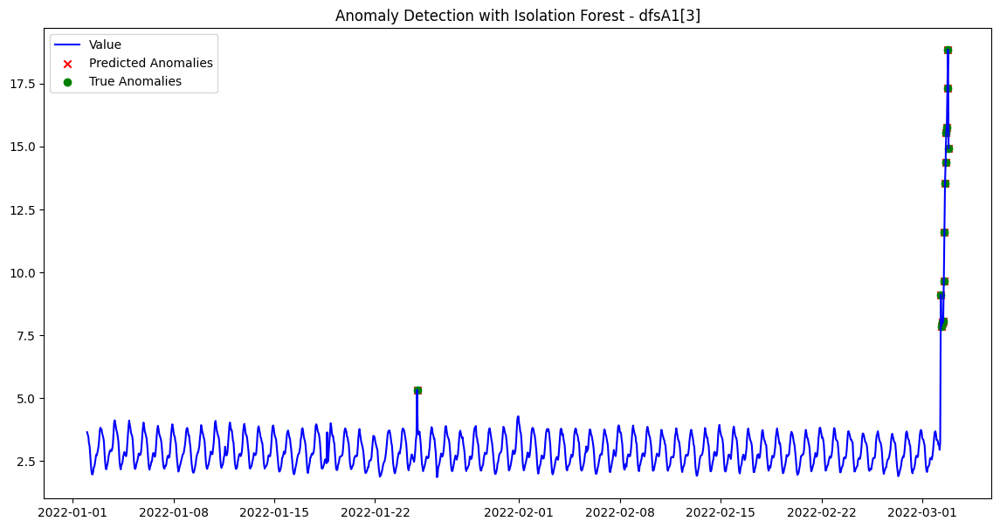

Processing dataset dfsA1[8]...
Best F1 Score for dfsA1[8]: 0.8333
Best Precision: 0.7143
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


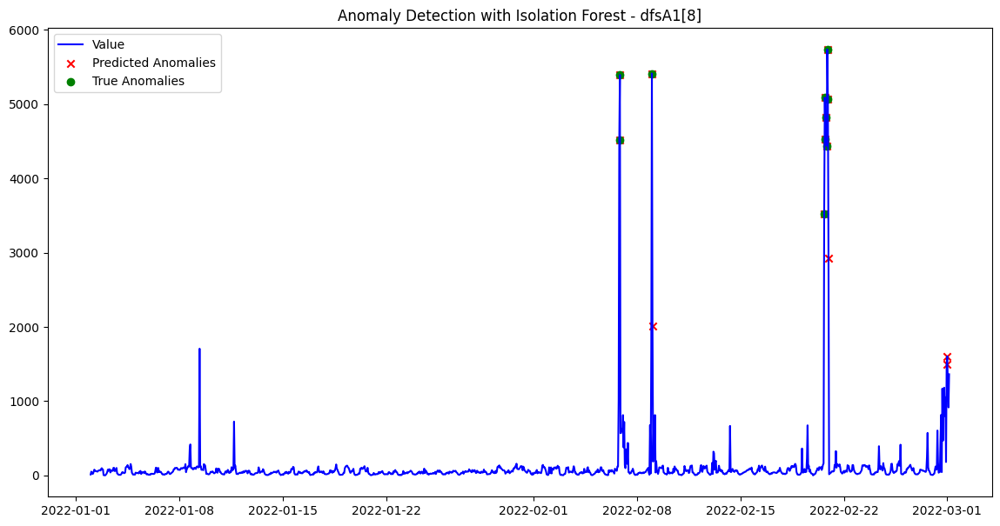

Processing dataset dfsA1[9]...
Best F1 Score for dfsA1[9]: 0.6957
Best Precision: 0.5333
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 0.5, 'n_estimators': 100, 'random_state': 42}


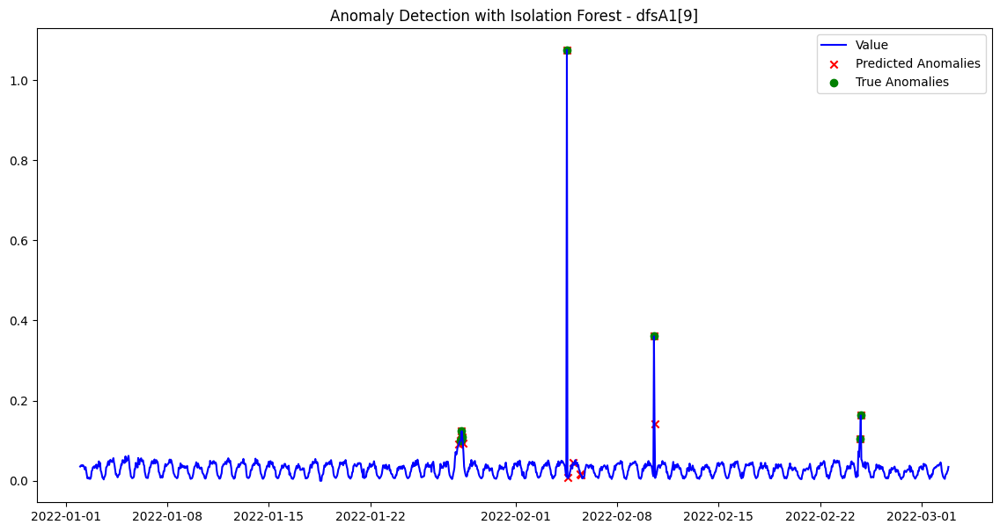

Processing dataset dfsA1[10]...
Best F1 Score for dfsA1[10]: 0.9286
Best Precision: 0.8667
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


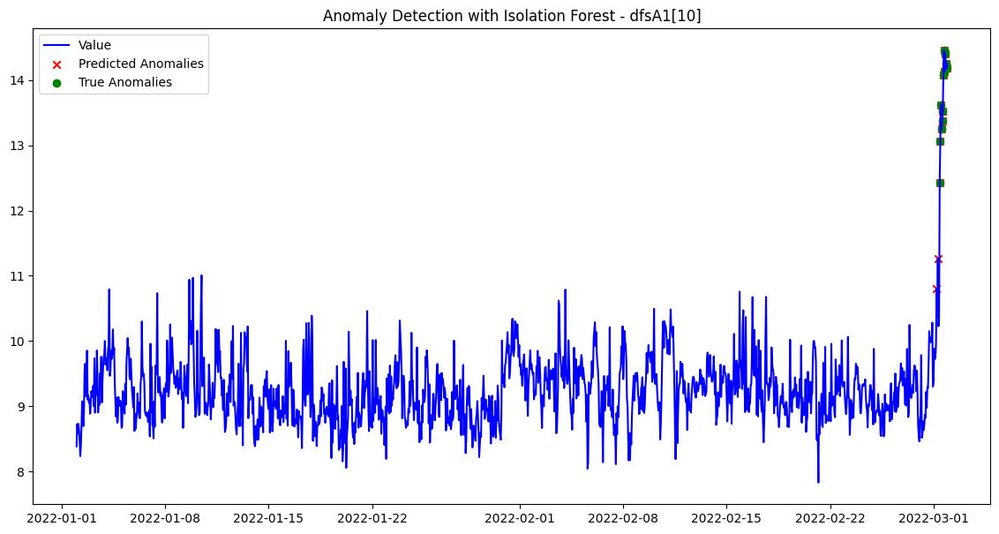

Processing dataset dfsA1[13]...
Best F1 Score for dfsA1[13]: 0.7407
Best Precision: 0.6667
Best Recall: 0.8333
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 0.5, 'n_estimators': 50, 'random_state': 42}


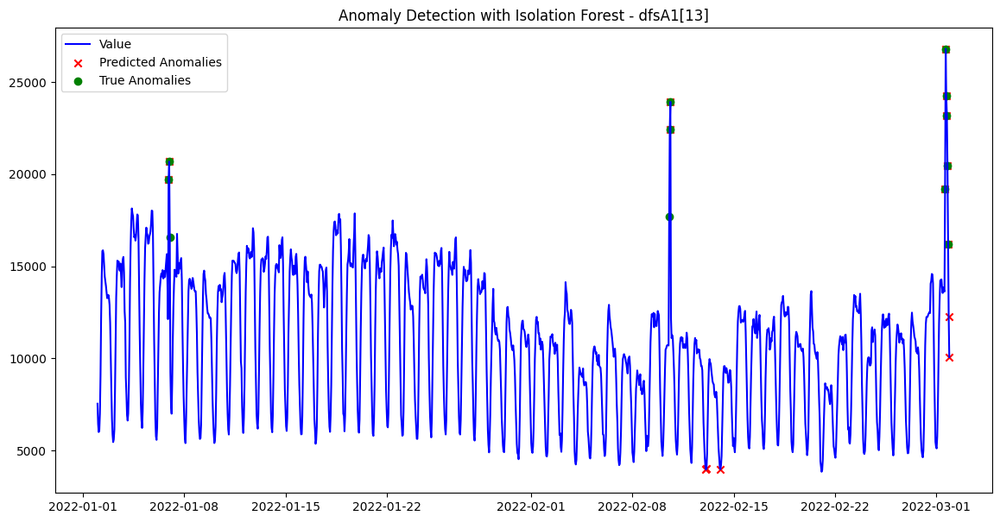

Processing dataset dfsA1[23]...
Best F1 Score for dfsA1[23]: 0.8485
Best Precision: 1.0000
Best Recall: 0.7368
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 0.5, 'n_estimators': 50, 'random_state': 42}


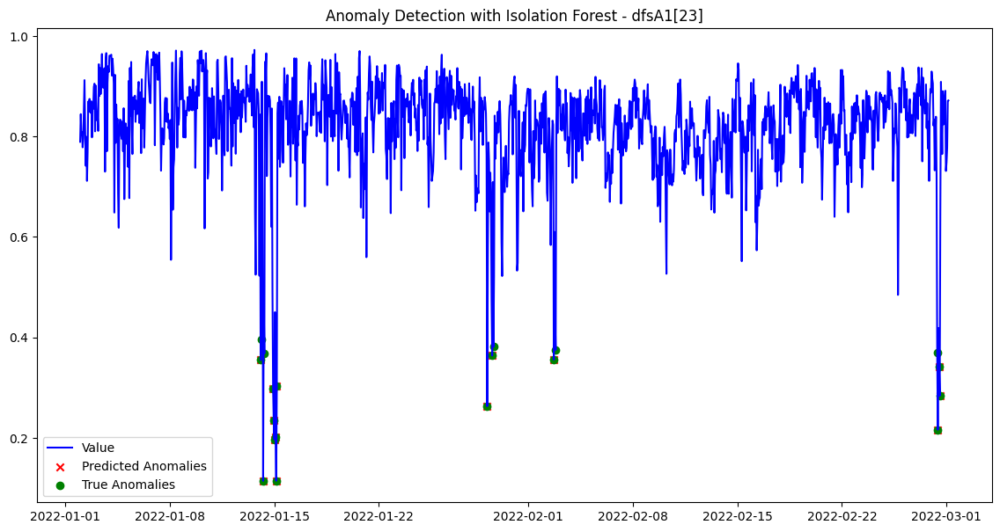

Processing dataset dfsA1[24]...
Best F1 Score for dfsA1[24]: 0.9677
Best Precision: 1.0000
Best Recall: 0.9375
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


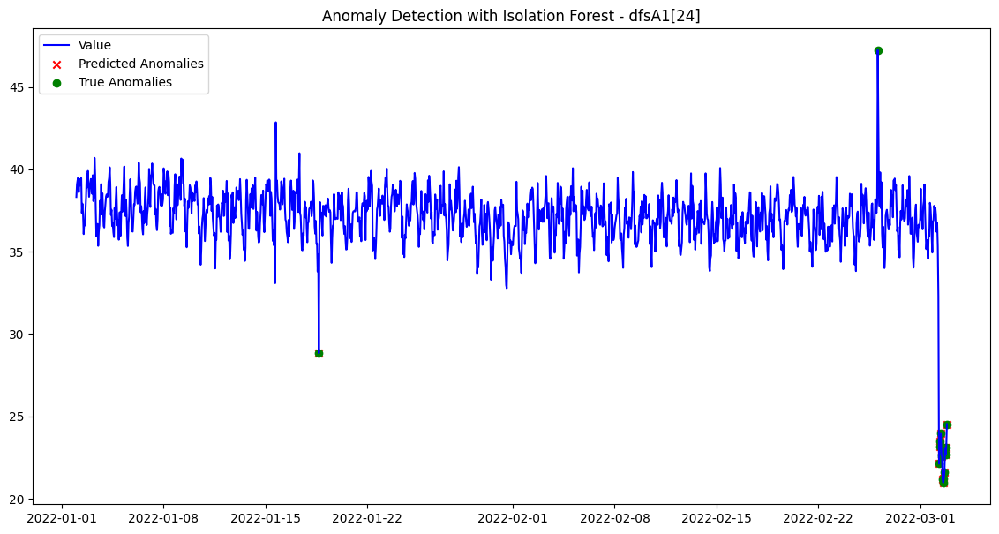

Processing dataset dfsA1[27]...
Best F1 Score for dfsA1[27]: 0.2353
Best Precision: 0.1333
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 0.5, 'n_estimators': 50, 'random_state': 42}


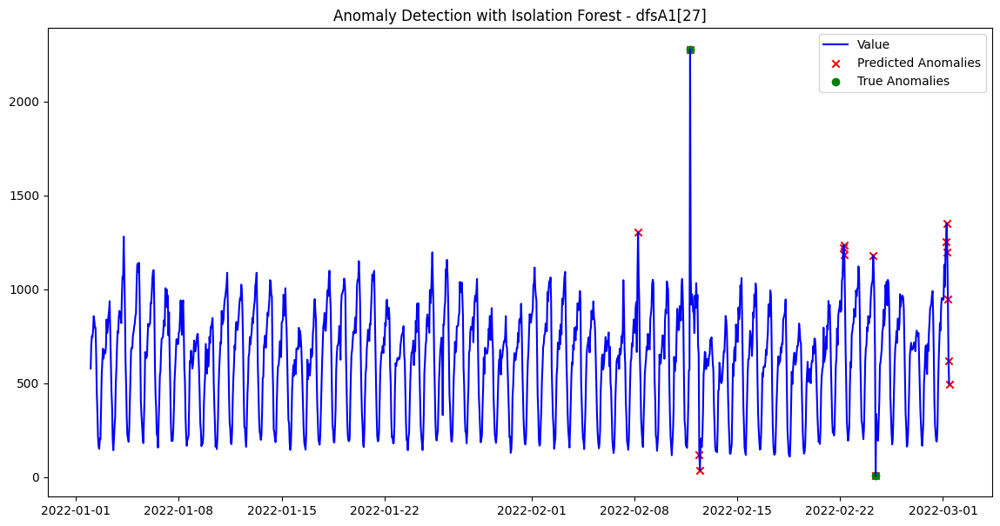

Processing dataset dfsA1[34]...
Best F1 Score for dfsA1[34]: 0.6364
Best Precision: 0.4667
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 0.5, 'n_estimators': 50, 'random_state': 42}


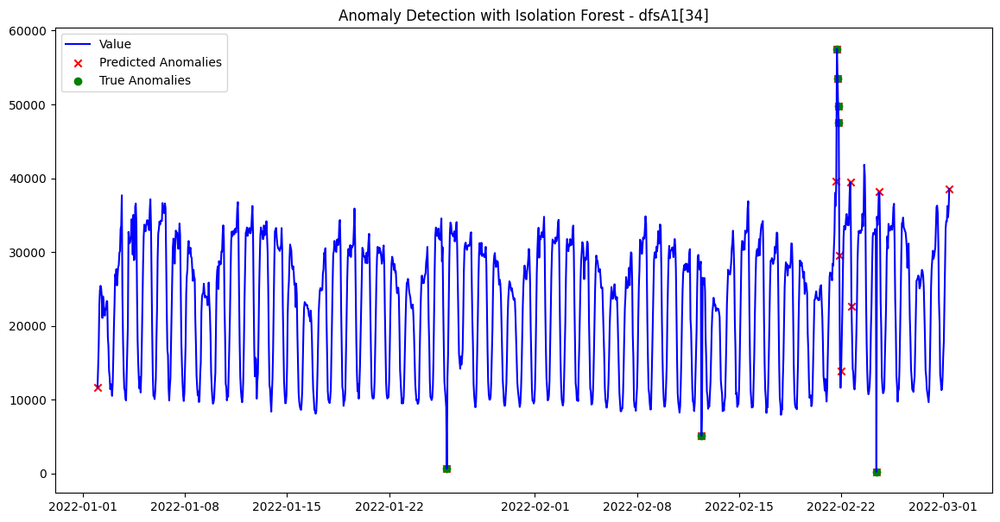

Processing dataset dfsA1[41]...
Best F1 Score for dfsA1[41]: 0.3333
Best Precision: 0.2000
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


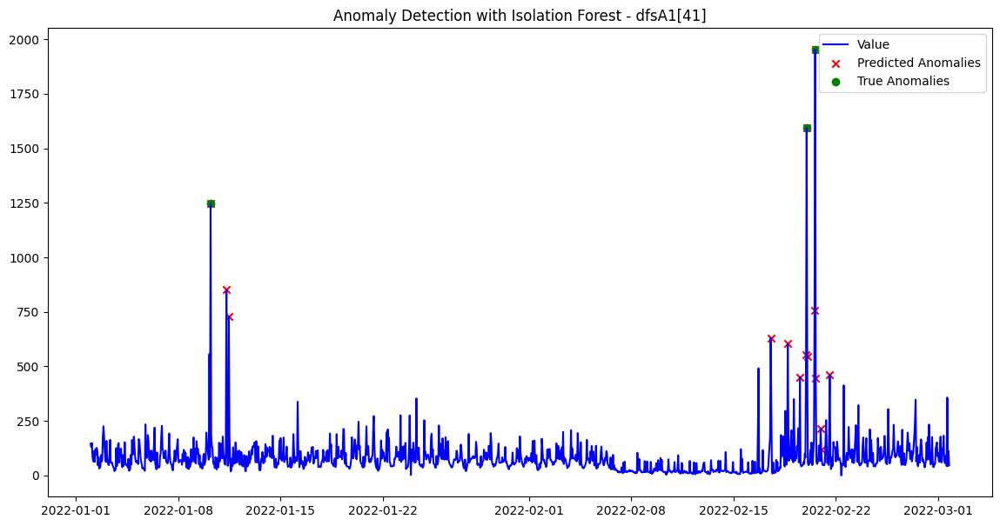

Processing dataset dfsA1[66]...
Best F1 Score for dfsA1[66]: 0.4615
Best Precision: 0.3000
Best Recall: 1.0000
Best Parameters: {'contamination': 0.05, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


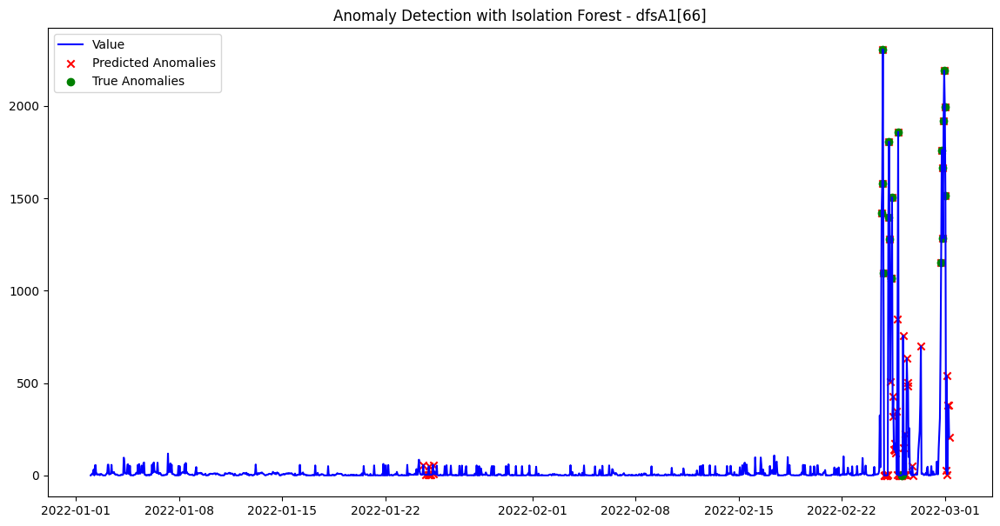

Average F1 Score across all datasets: 0.6845
Average Precision across all datasets: 0.6172
Average Recall across all datasets: 0.9573
All F1 Scores for each dataset: 0.2500, 0.9677, 1.0000, 0.8333, 0.6957, 0.9286, 0.7407, 0.8485, 0.9677, 0.2353, 0.6364, 0.3333, 0.4615


In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1A = [1,2,3,8,9,10,13,23,24,27,34,41,66]
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_samples': ['auto', 0.5, 0.75],
    'contamination': ['auto',0.01, 0.05, 0.1, 0.2, 0.3],
    'max_features': [12],
    'random_state': [42]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1A:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = feature_engineering(dfsA1[i], value_col=f"value_{i}", window_size=24)

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
       # if params['contamination'] == 'auto':
       #     params['contamination'] = contamination

        # Train Isolation Forest with current parameters
        isolation_forest = IsolationForest(
            n_estimators=params['n_estimators'],
            max_samples=params['max_samples'],
            contamination=params['contamination'],
            max_features=params["max_features"],
            random_state=params['random_state']
        )
        predictions = isolation_forest.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with Isolation Forest - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


## Isolation Forest

Processing dataset dfsA1[1]...
Best F1 Score for dfsA1[1]: 0.2353
Best Precision: 0.1333
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


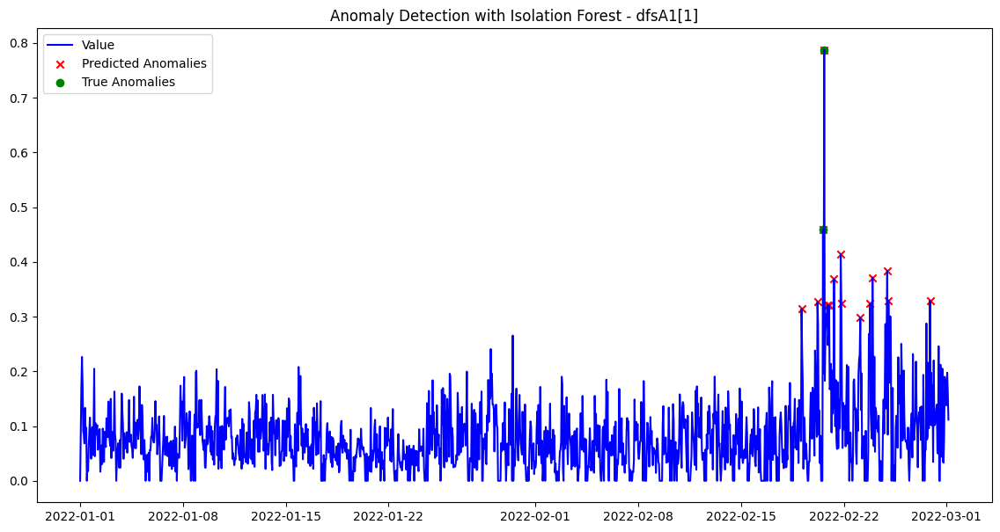

Processing dataset dfsA1[2]...
Best F1 Score for dfsA1[2]: 0.9677
Best Precision: 1.0000
Best Recall: 0.9375
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


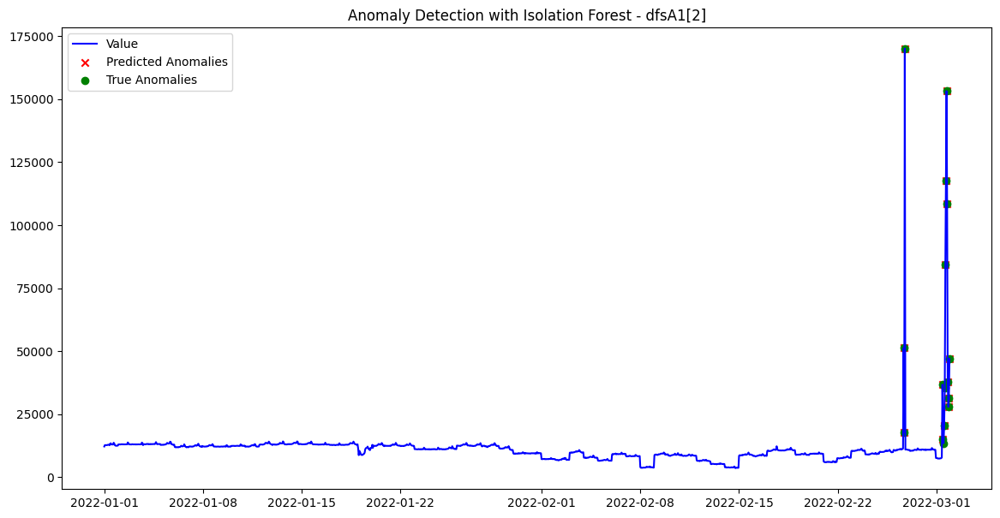

Processing dataset dfsA1[3]...
Best F1 Score for dfsA1[3]: 1.0000
Best Precision: 1.0000
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


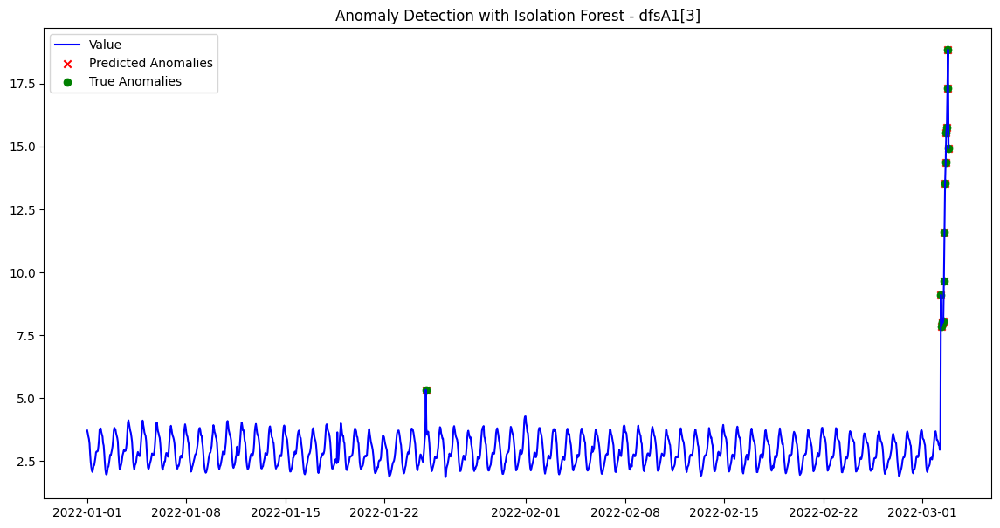

Processing dataset dfsA1[8]...
Best F1 Score for dfsA1[8]: 0.8333
Best Precision: 0.7143
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


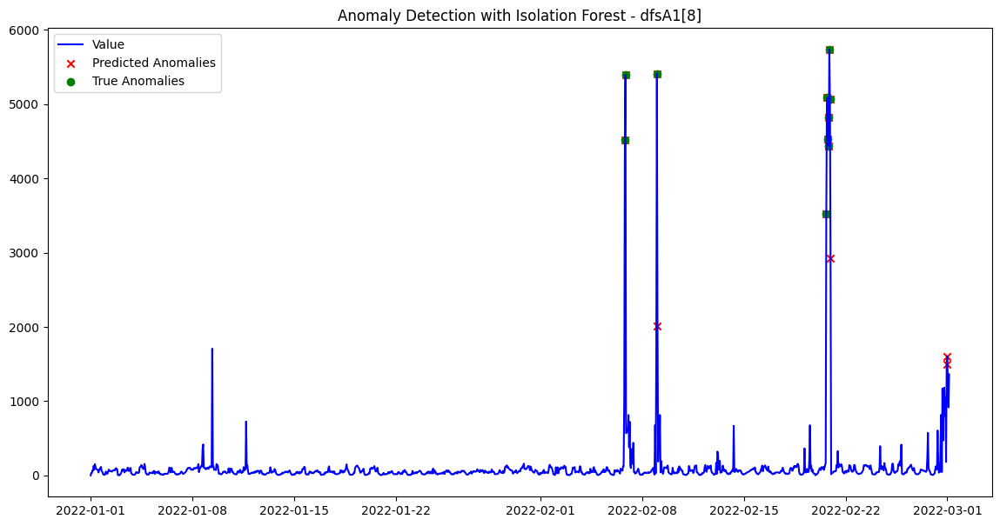

Processing dataset dfsA1[9]...
Best F1 Score for dfsA1[9]: 0.7273
Best Precision: 0.5714
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 200, 'random_state': 42}


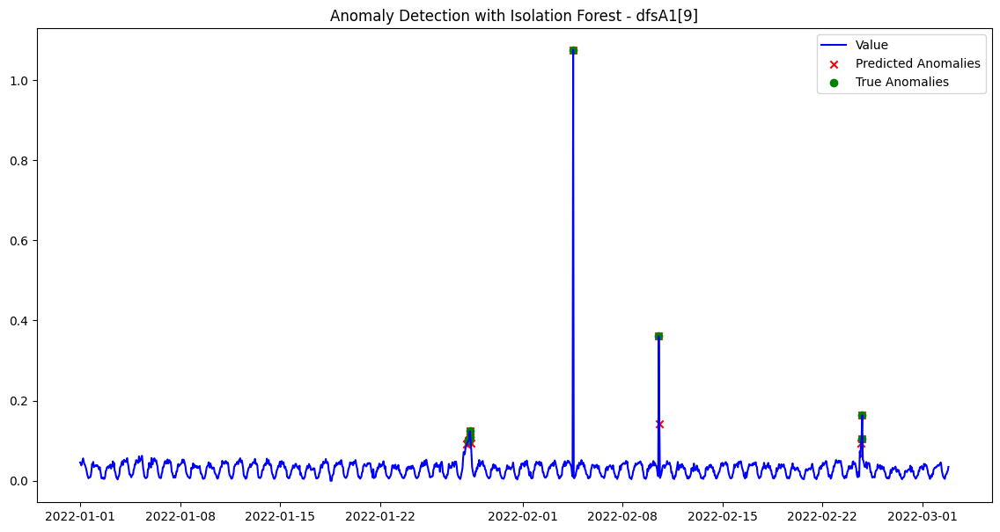

Processing dataset dfsA1[10]...
Best F1 Score for dfsA1[10]: 0.9286
Best Precision: 0.8667
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


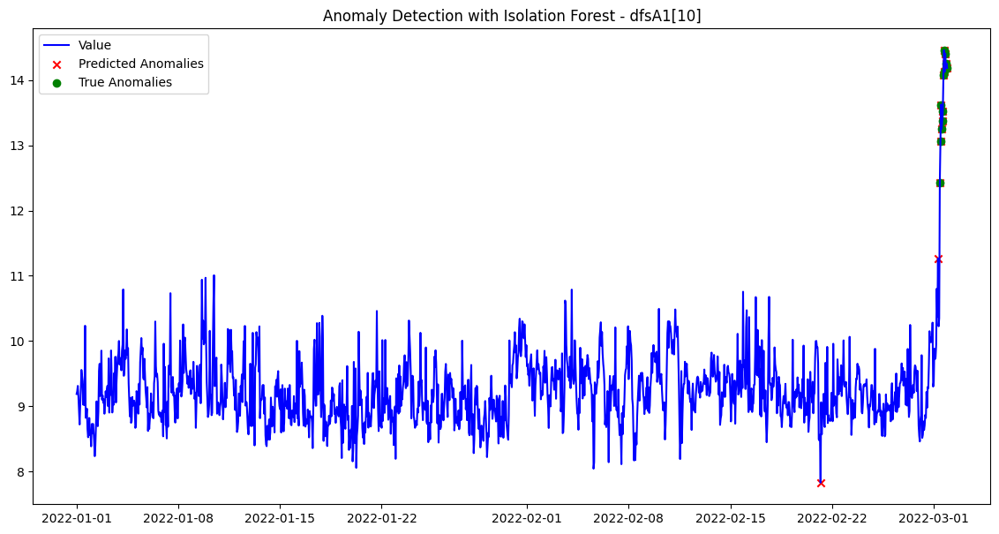

Processing dataset dfsA1[13]...
Best F1 Score for dfsA1[13]: 0.6667
Best Precision: 0.6000
Best Recall: 0.7500
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


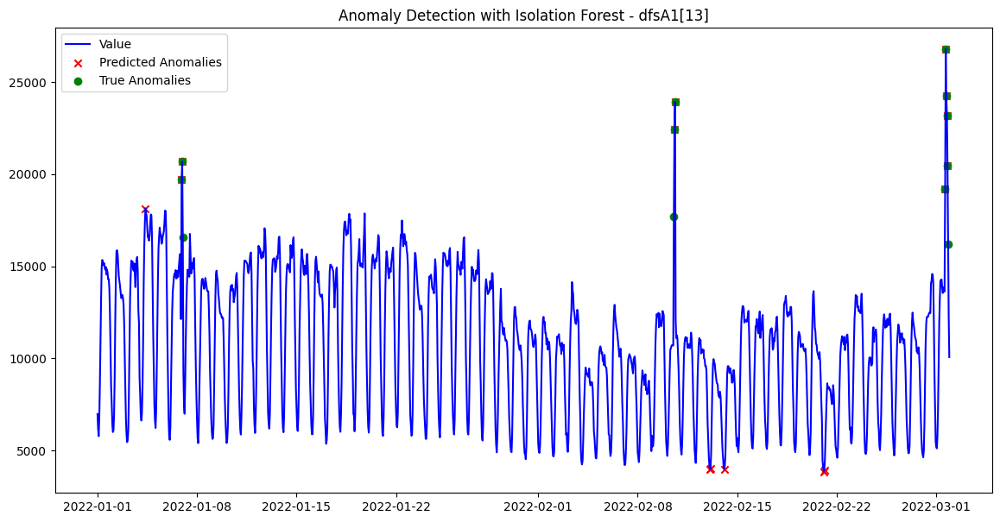

Processing dataset dfsA1[23]...
Best F1 Score for dfsA1[23]: 0.8235
Best Precision: 0.9333
Best Recall: 0.7368
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


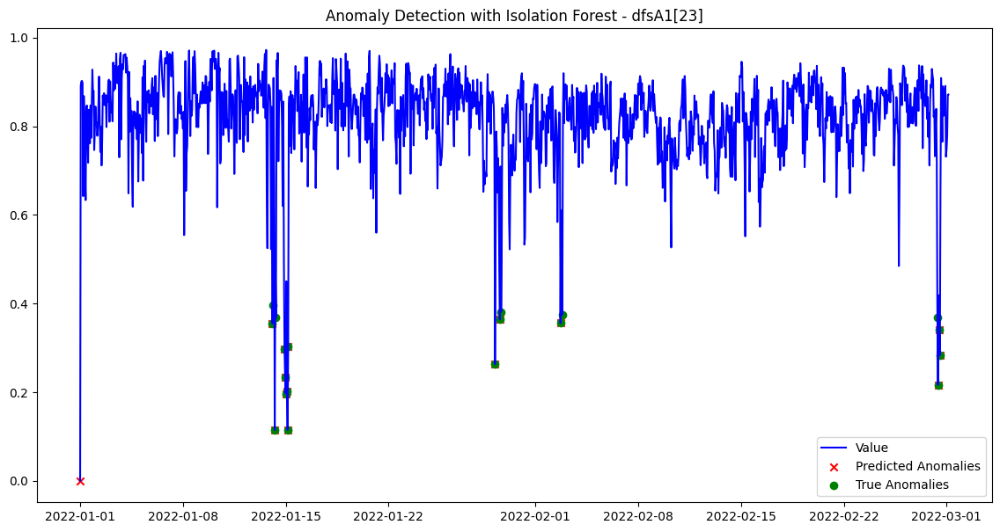

Processing dataset dfsA1[24]...
Best F1 Score for dfsA1[24]: 0.9677
Best Precision: 1.0000
Best Recall: 0.9375
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


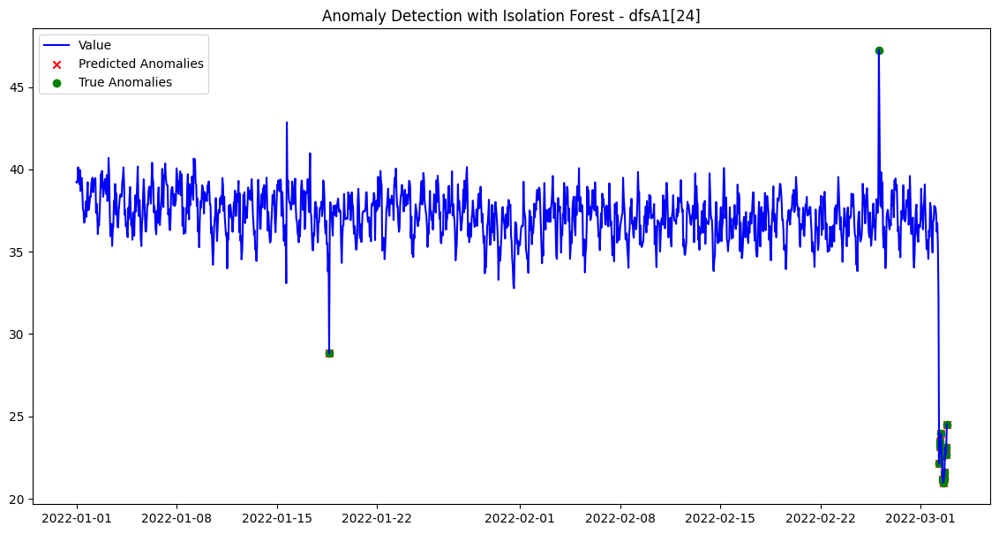

Processing dataset dfsA1[27]...
Best F1 Score for dfsA1[27]: 0.2353
Best Precision: 0.1333
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


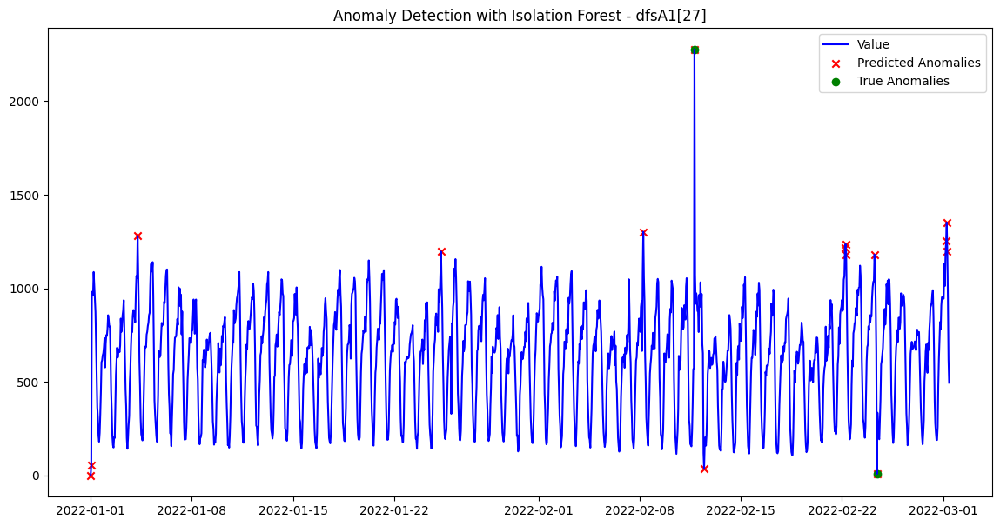

Processing dataset dfsA1[34]...
Best F1 Score for dfsA1[34]: 0.6364
Best Precision: 0.4667
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


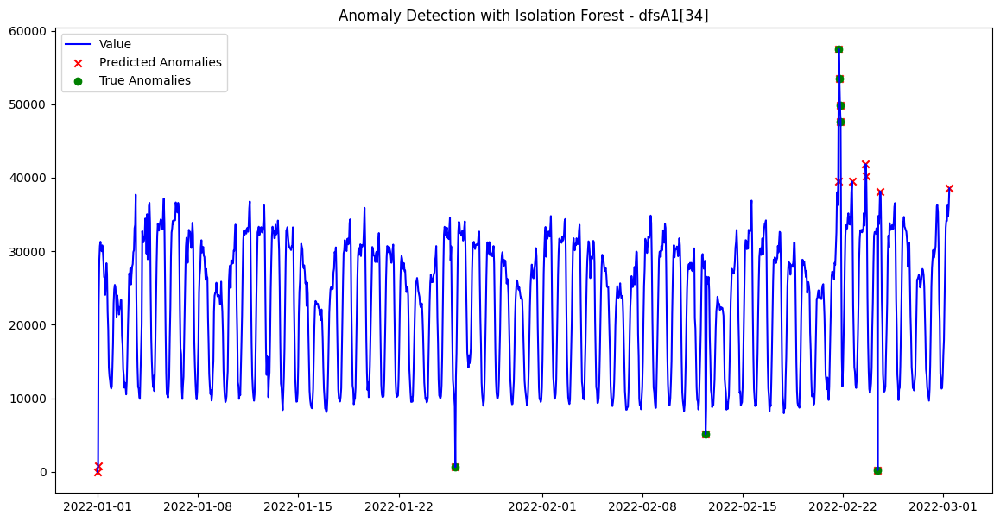

Processing dataset dfsA1[41]...
Best F1 Score for dfsA1[41]: 0.3333
Best Precision: 0.2000
Best Recall: 1.0000
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


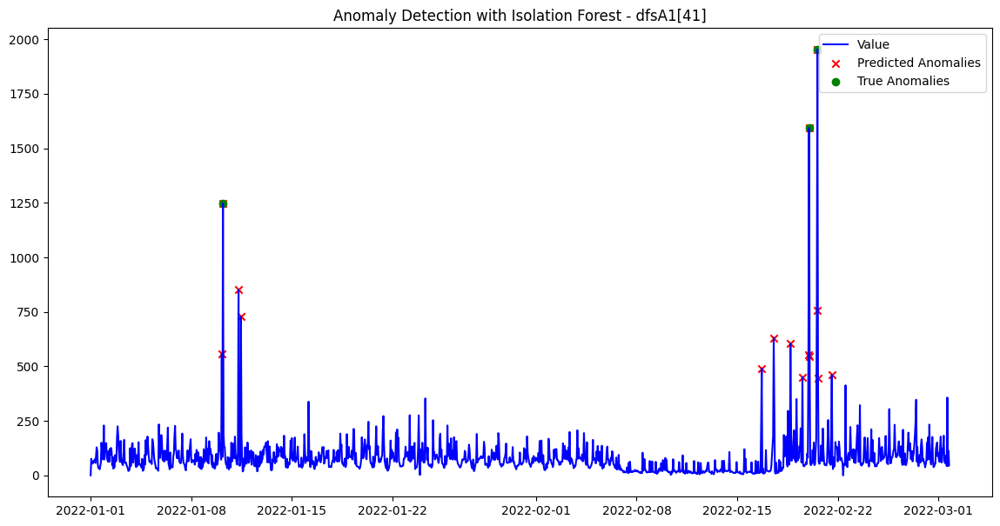

Processing dataset dfsA1[66]...
Best F1 Score for dfsA1[66]: 0.8333
Best Precision: 1.0000
Best Recall: 0.7143
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


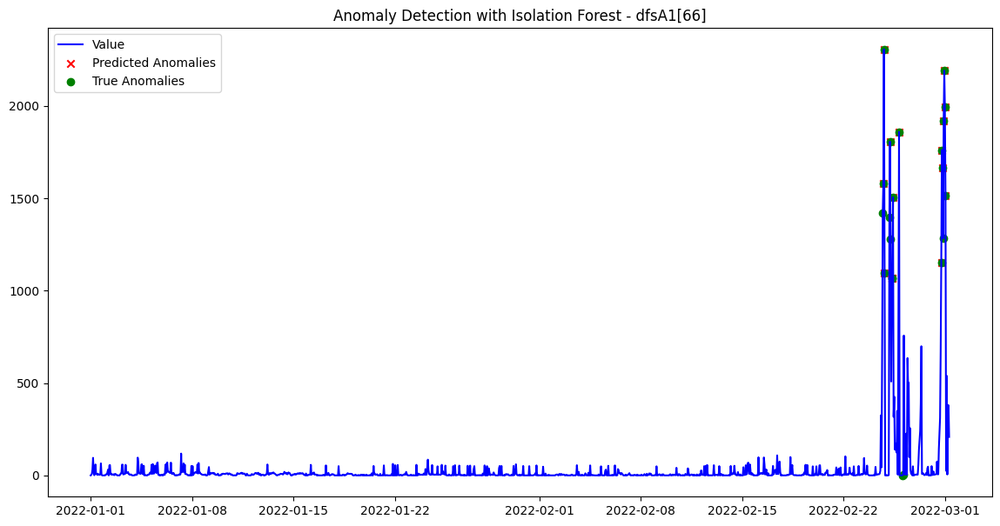

Average F1 Score across all datasets: 0.7068
Average Precision across all datasets: 0.6630
Average Recall across all datasets: 0.9289
All F1 Scores for each dataset: 0.2353, 0.9677, 1.0000, 0.8333, 0.7273, 0.9286, 0.6667, 0.8235, 0.9677, 0.2353, 0.6364, 0.3333, 0.8333


In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1A = [1,2,3,8,9,10,13,23,24,27,34,41,66]
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_samples': ['auto', 0.5, 0.75],
    'contamination': ['auto',0.01, 0.05, 0.1, 0.2, 0.3],
    'max_features': [1],
    'random_state': [42]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1A:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = dfsA1[i]

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
       # if params['contamination'] == 'auto':
       #     params['contamination'] = contamination

        # Train Isolation Forest with current parameters
        isolation_forest = IsolationForest(
            n_estimators=params['n_estimators'],
            max_samples=params['max_samples'],
            contamination=params['contamination'],
            max_features=params["max_features"],
            random_state=params['random_state']
        )
        predictions = isolation_forest.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with Isolation Forest - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


## A1B - Stationarity with change shift

## temp col

Processing dataset dfsA1[7]...
Best F1 Score for dfsA1[7]: 0.5954
Best Precision: 0.5571
Best Recall: 0.6393
Best Parameters: {'contamination': 0.05, 'max_features': 12, 'max_samples': 0.75, 'n_estimators': 200, 'random_state': 42}


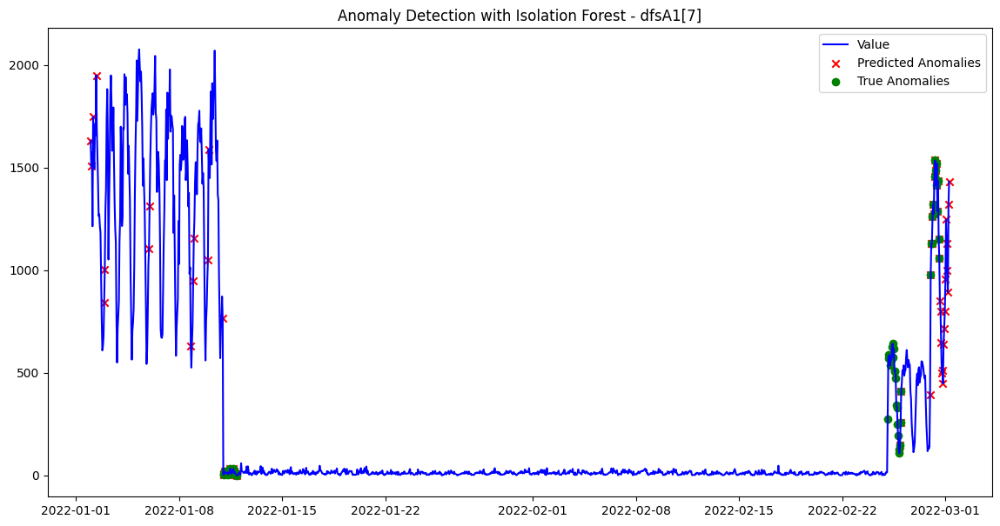

Processing dataset dfsA1[20]...
Best F1 Score for dfsA1[20]: 0.3468
Best Precision: 0.2143
Best Recall: 0.9091
Best Parameters: {'contamination': 0.1, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


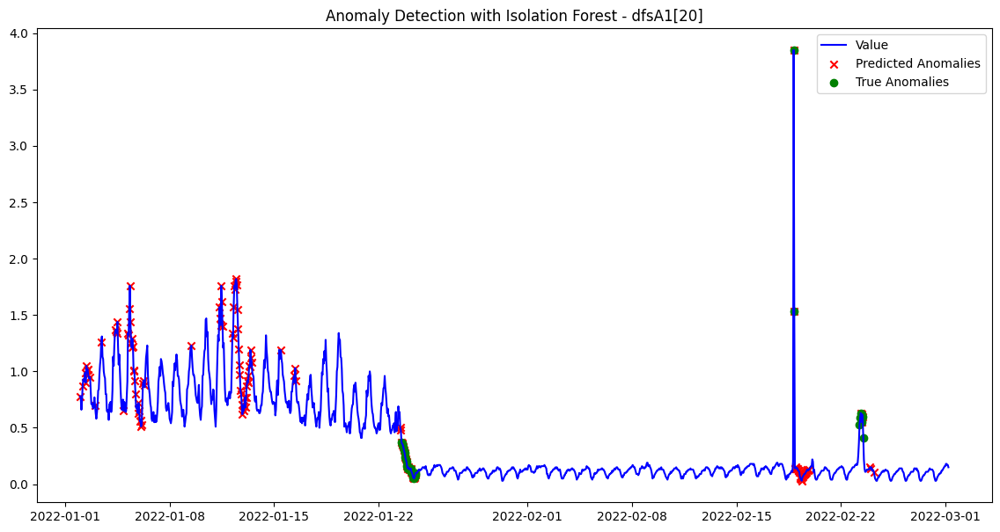

Processing dataset dfsA1[31]...
Best F1 Score for dfsA1[31]: 0.7179
Best Precision: 0.9333
Best Recall: 0.5833
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


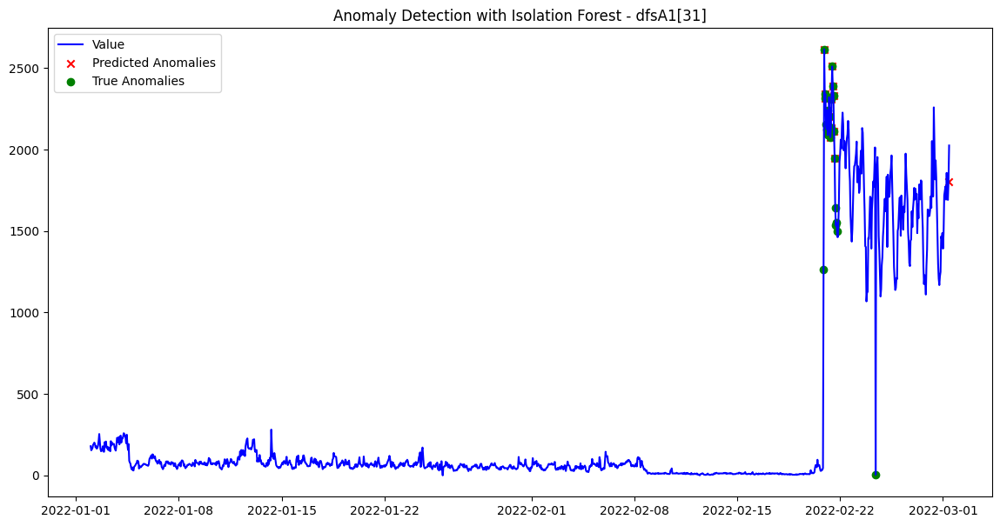

Processing dataset dfsA1[32]...
Best F1 Score for dfsA1[32]: 0.7119
Best Precision: 0.5915
Best Recall: 0.8936
Best Parameters: {'contamination': 0.05, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 100, 'random_state': 42}


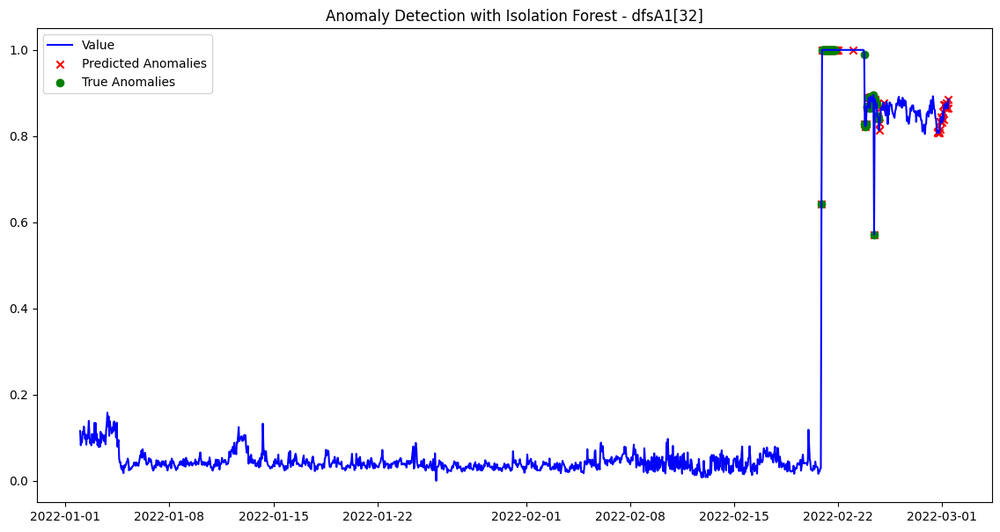

Processing dataset dfsA1[48]...
Best F1 Score for dfsA1[48]: 0.2892
Best Precision: 0.1690
Best Recall: 1.0000
Best Parameters: {'contamination': 0.1, 'max_features': 12, 'max_samples': 0.5, 'n_estimators': 50, 'random_state': 42}


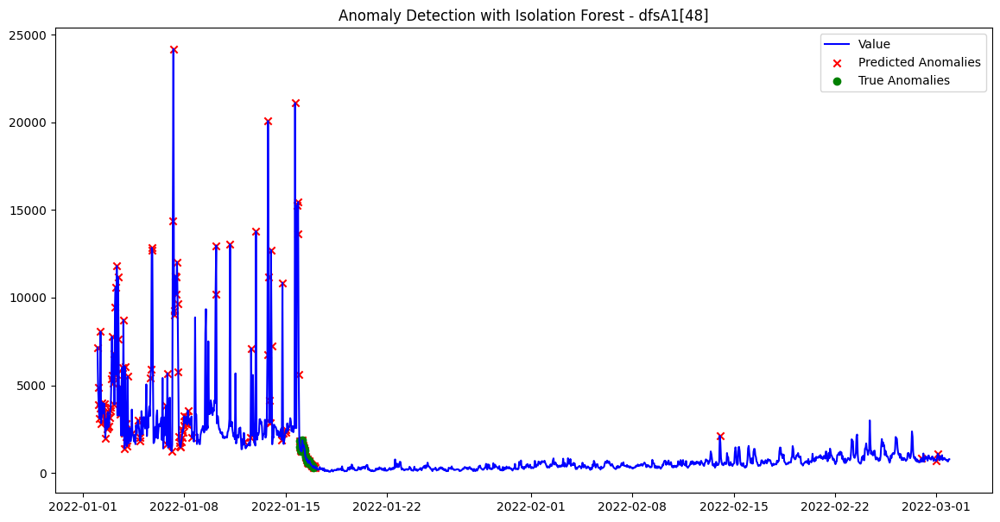

Processing dataset dfsA1[57]...
Best F1 Score for dfsA1[57]: 0.0541
Best Precision: 0.0282
Best Recall: 0.6667
Best Parameters: {'contamination': 0.05, 'max_features': 12, 'max_samples': 0.5, 'n_estimators': 100, 'random_state': 42}


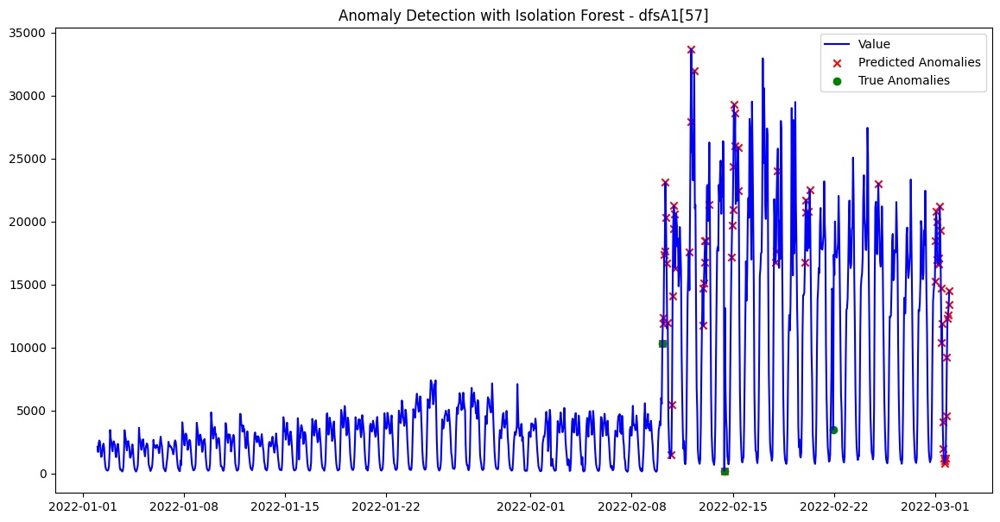

Processing dataset dfsA1[61]...
Best F1 Score for dfsA1[61]: 0.1446
Best Precision: 0.0845
Best Recall: 0.5000
Best Parameters: {'contamination': 0.1, 'max_features': 12, 'max_samples': 0.75, 'n_estimators': 50, 'random_state': 42}


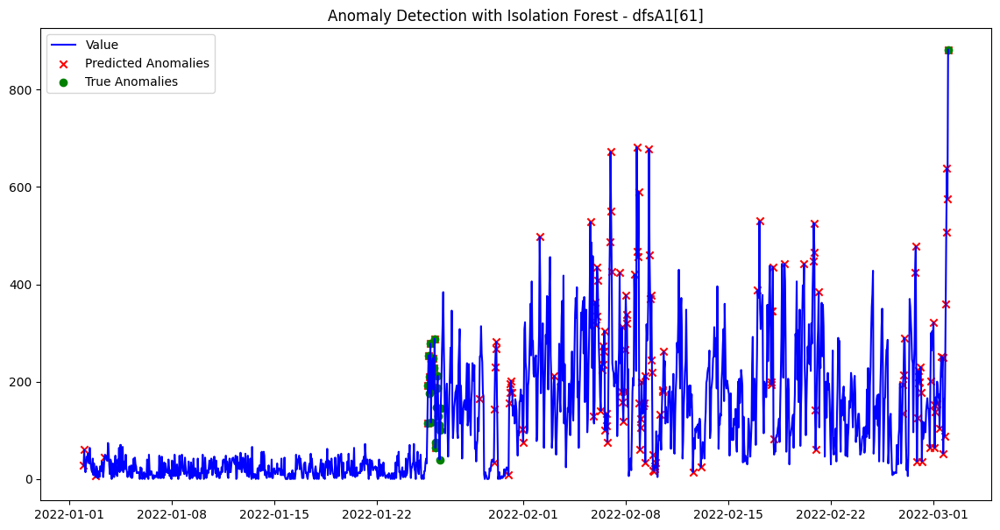

Average F1 Score across all datasets: 0.4085
Average Precision across all datasets: 0.3683
Average Recall across all datasets: 0.7417
All F1 Scores for each dataset: 0.5954, 0.3468, 0.7179, 0.7119, 0.2892, 0.0541, 0.1446


In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1B = [7,20,31,32,48,57,61]
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_samples': ['auto', 0.5, 0.75],
    'contamination': ['auto',0.01, 0.05, 0.1, 0.2, 0.3],
    'max_features': [12],
    'random_state': [42]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1B:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = feature_engineering(dfsA1[i], value_col=f"value_{i}", window_size=24)

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
       # if params['contamination'] == 'auto':
       #     params['contamination'] = contamination

        # Train Isolation Forest with current parameters
        isolation_forest = IsolationForest(
            n_estimators=params['n_estimators'],
            max_samples=params['max_samples'],
            contamination=params['contamination'],
            max_features=params["max_features"],
            random_state=params['random_state']
        )
        predictions = isolation_forest.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with Isolation Forest - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


## not temp col

Processing dataset dfsA1[7]...
Best F1 Score for dfsA1[7]: 0.1860
Best Precision: 0.1084
Best Recall: 0.6557
Best Parameters: {'contamination': 'auto', 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


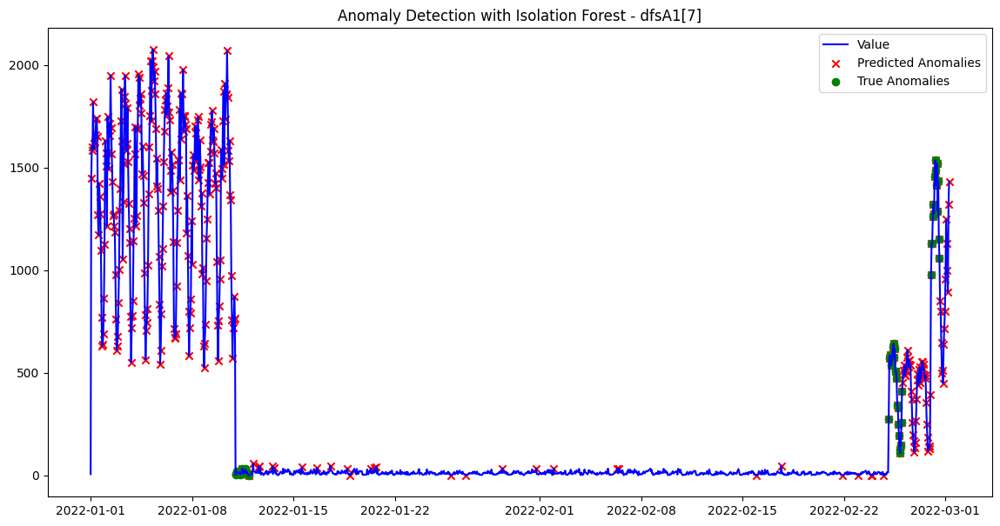

Processing dataset dfsA1[20]...
Best F1 Score for dfsA1[20]: 0.2353
Best Precision: 0.1739
Best Recall: 0.3636
Best Parameters: {'contamination': 0.05, 'max_features': 1, 'max_samples': 0.5, 'n_estimators': 50, 'random_state': 42}


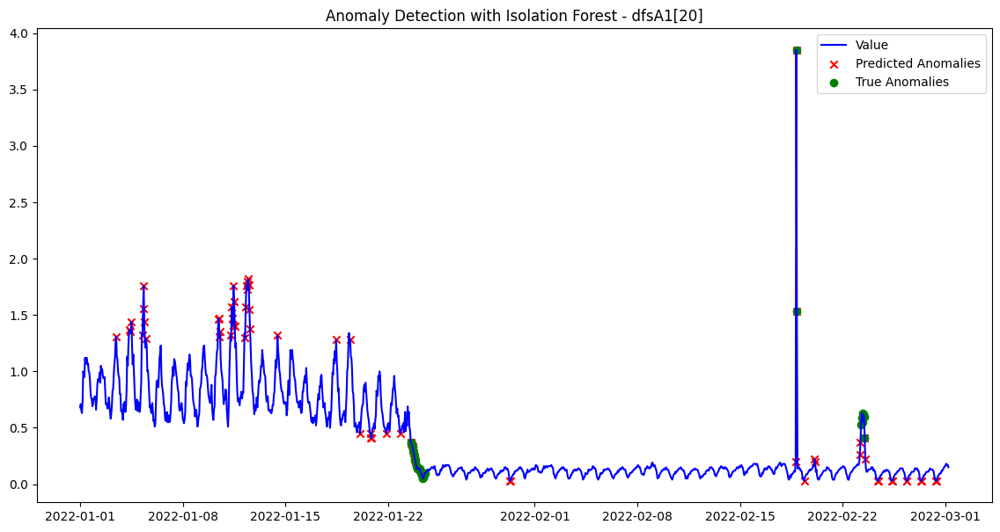

Processing dataset dfsA1[31]...
Best F1 Score for dfsA1[31]: 0.4737
Best Precision: 0.6429
Best Recall: 0.3750
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 200, 'random_state': 42}


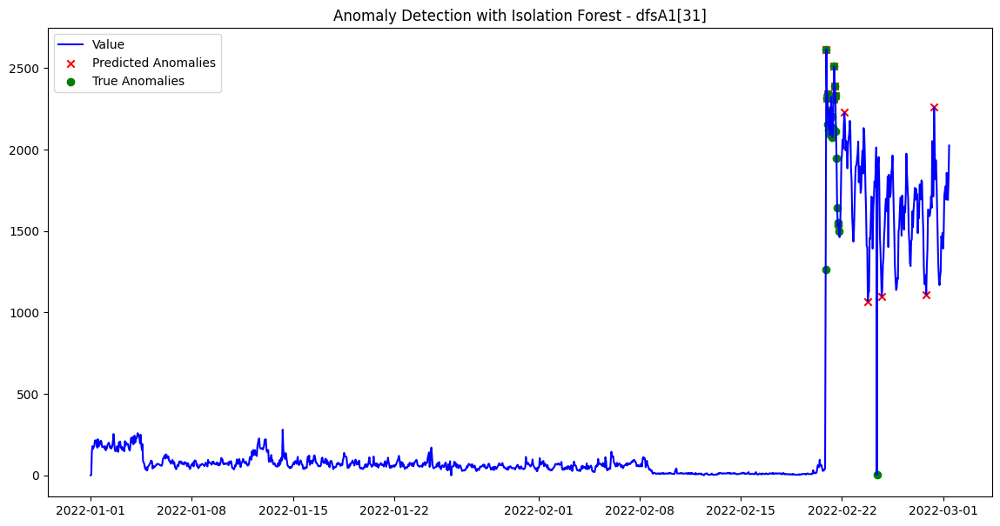

Processing dataset dfsA1[32]...
Best F1 Score for dfsA1[32]: 0.3704
Best Precision: 0.2465
Best Recall: 0.7447
Best Parameters: {'contamination': 0.1, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


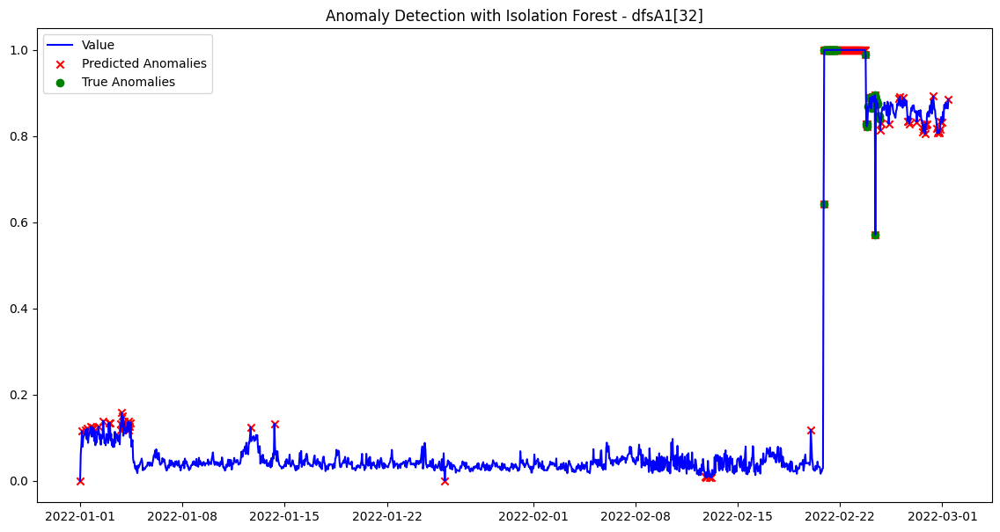

Processing dataset dfsA1[48]...
Best F1 Score for dfsA1[48]: 0.0577
Best Precision: 0.0312
Best Recall: 0.3750
Best Parameters: {'contamination': 0.2, 'max_features': 1, 'max_samples': 0.75, 'n_estimators': 100, 'random_state': 42}


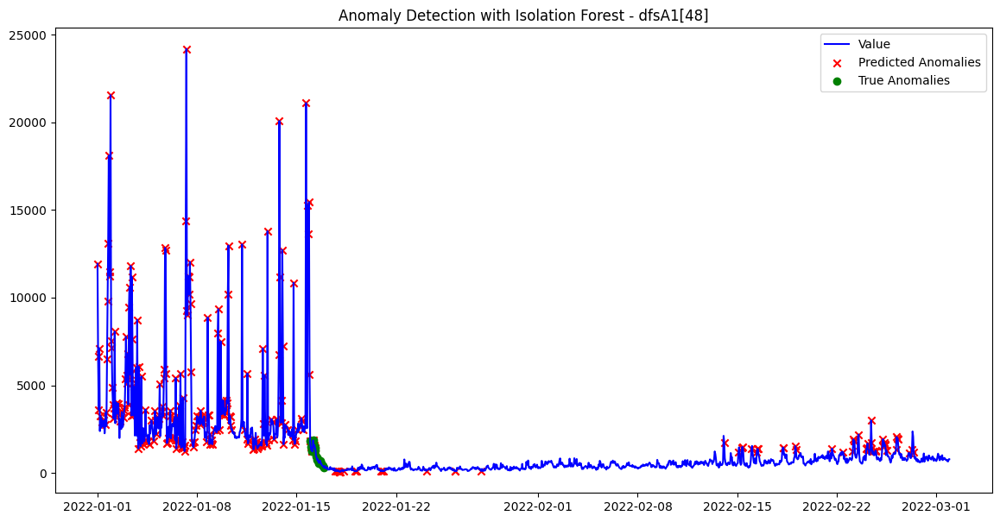

Processing dataset dfsA1[57]...
Best F1 Score for dfsA1[57]: 0.0267
Best Precision: 0.0139
Best Recall: 0.3333
Best Parameters: {'contamination': 0.05, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


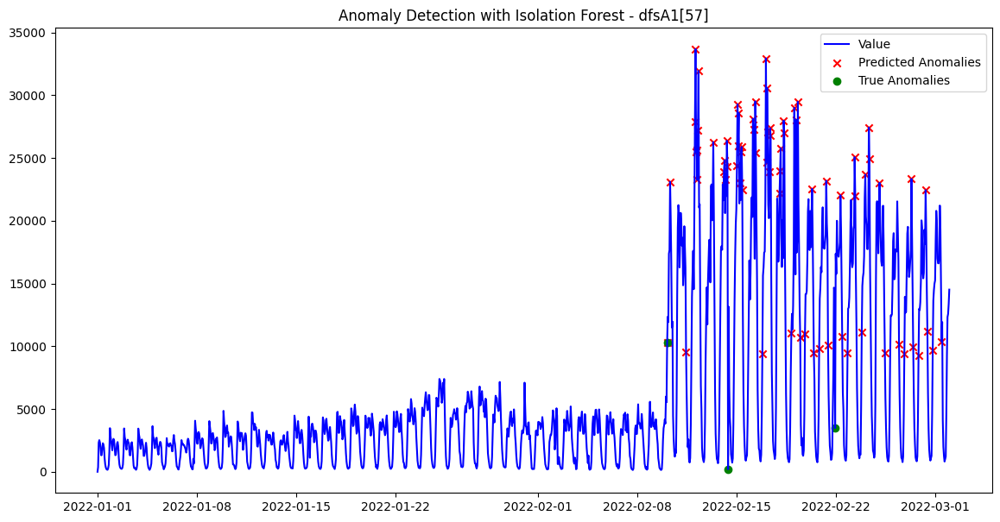

Processing dataset dfsA1[61]...
Best F1 Score for dfsA1[61]: 0.0542
Best Precision: 0.0285
Best Recall: 0.5417
Best Parameters: {'contamination': 'auto', 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


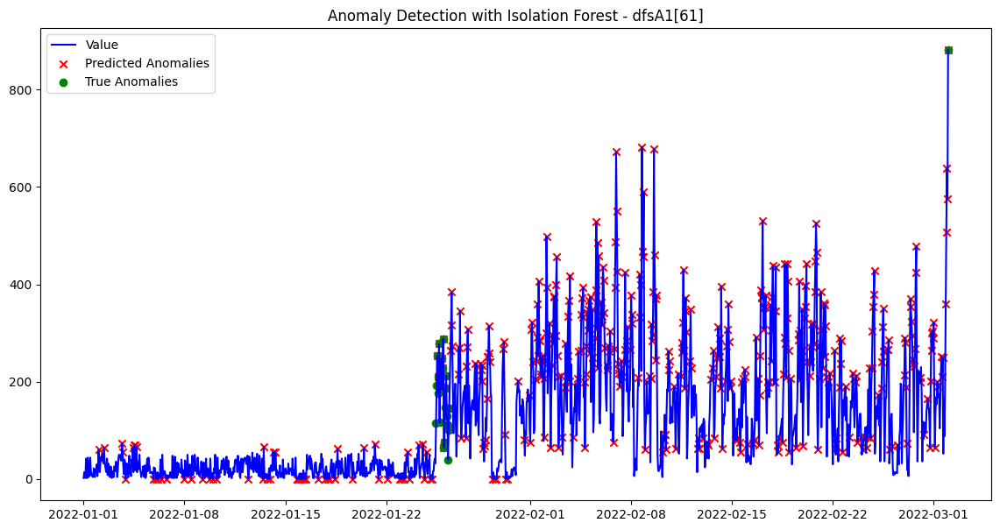

Average F1 Score across all datasets: 0.2006
Average Precision across all datasets: 0.1779
Average Recall across all datasets: 0.4842
All F1 Scores for each dataset: 0.1860, 0.2353, 0.4737, 0.3704, 0.0577, 0.0267, 0.0542


In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1B = [7,20,31,32,48,57,61]
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_samples': ['auto', 0.5, 0.75],
    'contamination': ['auto',0.01, 0.05, 0.1, 0.2, 0.3],
    'max_features': [1],
    'random_state': [42]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1B:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = dfsA1[i]

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
       # if params['contamination'] == 'auto':
       #     params['contamination'] = contamination

        # Train Isolation Forest with current parameters
        isolation_forest = IsolationForest(
            n_estimators=params['n_estimators'],
            max_samples=params['max_samples'],
            contamination=params['contamination'],
            max_features=params["max_features"],
            random_state=params['random_state']
        )
        predictions = isolation_forest.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with Isolation Forest - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


### Yahoo A1C - Collective and Contextual anomalies

## TEMP

Processing dataset dfsA1[17]...
Best F1 Score for dfsA1[17]: 0.8915
Best Precision: 0.8071
Best Recall: 0.9956
Best Parameters: {'contamination': 0.2, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


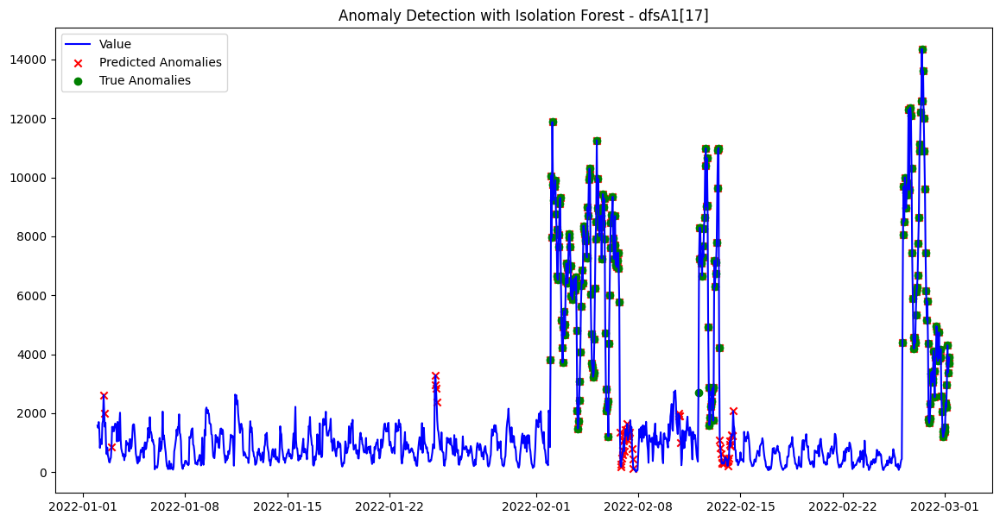

Processing dataset dfsA1[19]...
Best F1 Score for dfsA1[19]: 0.8718
Best Precision: 0.7893
Best Recall: 0.9736
Best Parameters: {'contamination': 0.2, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


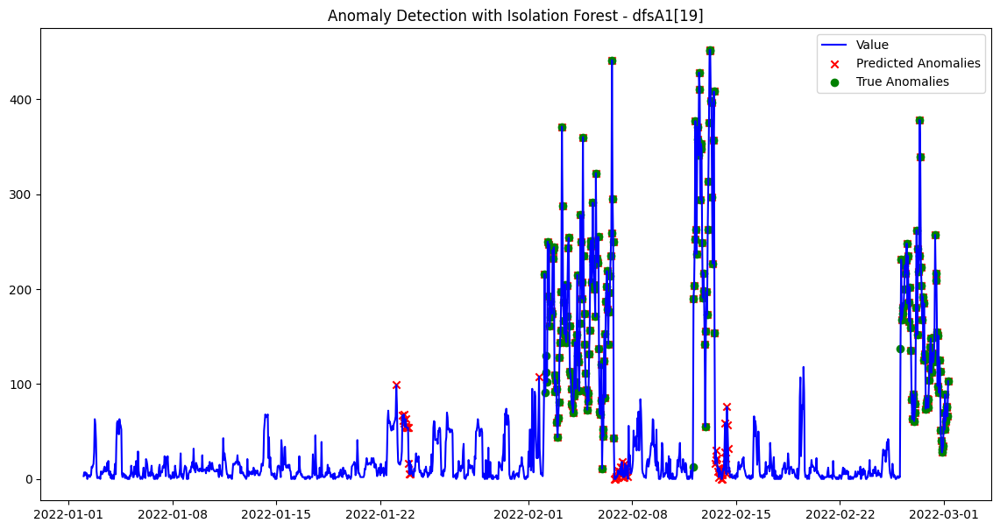

Processing dataset dfsA1[26]...
Best F1 Score for dfsA1[26]: 0.4034
Best Precision: 0.2553
Best Recall: 0.9600
Best Parameters: {'contamination': 0.2, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 200, 'random_state': 42}


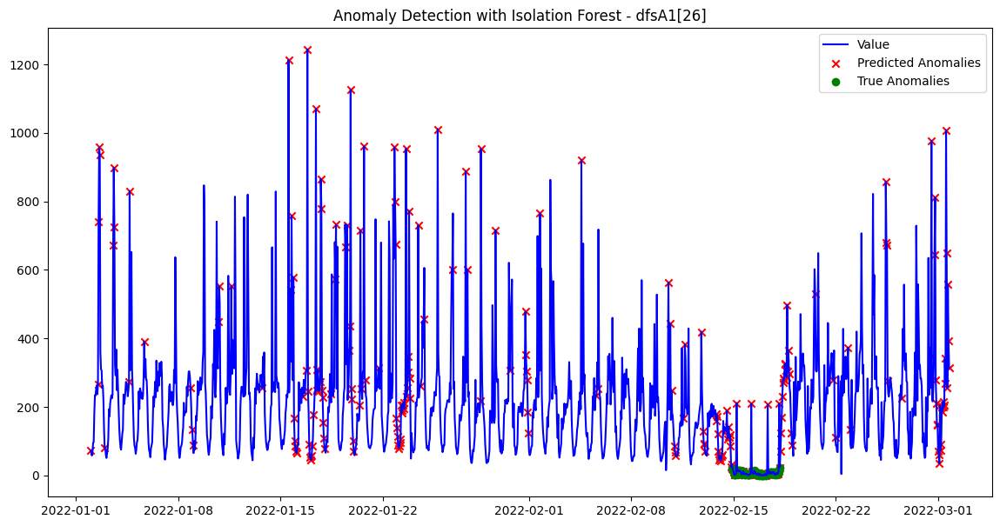

Processing dataset dfsA1[37]...
Best F1 Score for dfsA1[37]: 0.4898
Best Precision: 0.8000
Best Recall: 0.3529
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 0.75, 'n_estimators': 100, 'random_state': 42}


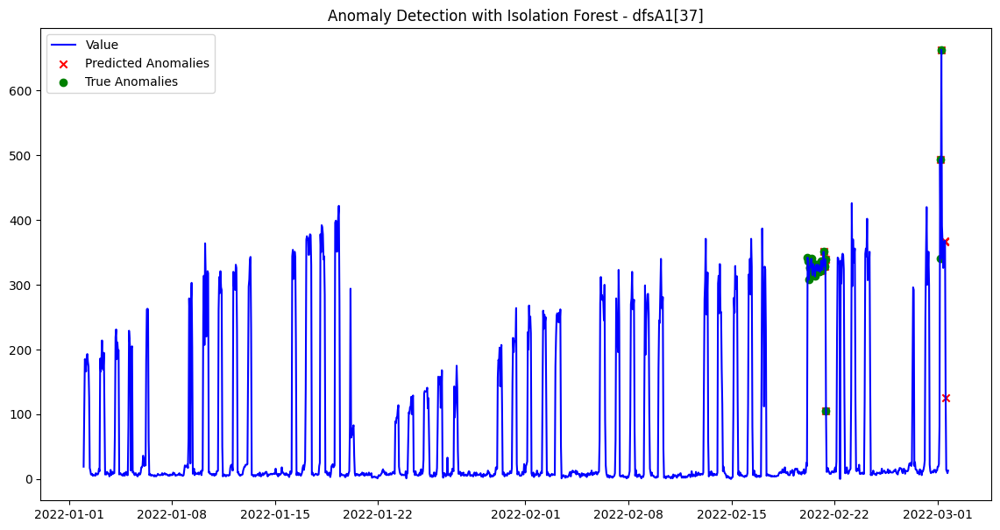

Processing dataset dfsA1[40]...
Best F1 Score for dfsA1[40]: 0.5339
Best Precision: 0.4184
Best Recall: 0.7375
Best Parameters: {'contamination': 0.1, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


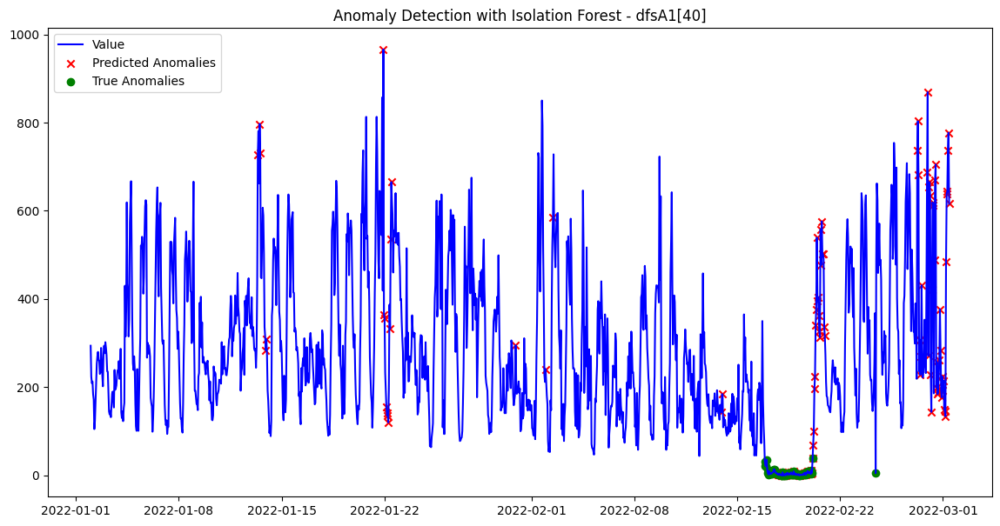

Processing dataset dfsA1[47]...
Best F1 Score for dfsA1[47]: 0.0800
Best Precision: 0.0667
Best Recall: 0.1000
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


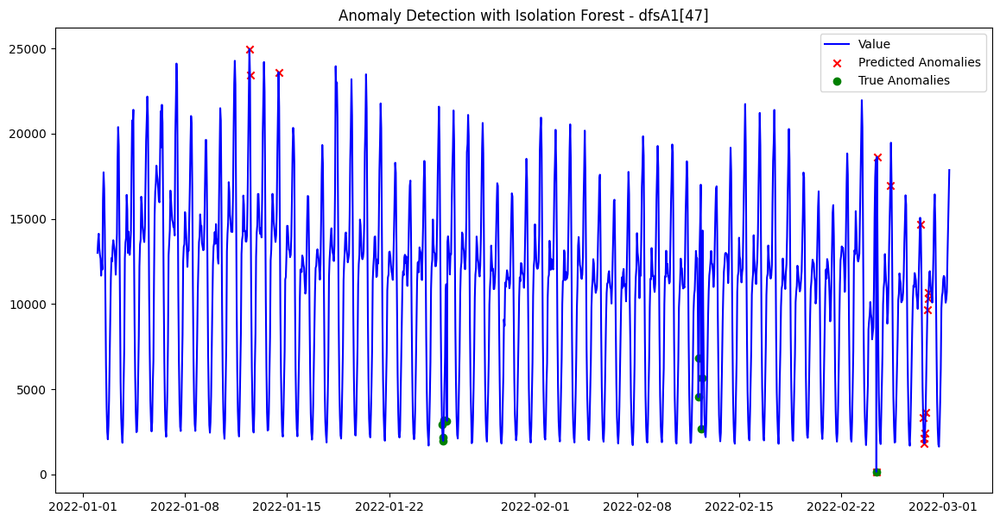

Average F1 Score across all datasets: 0.5451
Average Precision across all datasets: 0.5228
Average Recall across all datasets: 0.6866
All F1 Scores for each dataset: 0.8915, 0.8718, 0.4034, 0.4898, 0.5339, 0.0800


In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1C = [17, 19, 26, 37, 40, 47]
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_samples': ['auto', 0.5, 0.75],
    'contamination': ['auto',0.01, 0.05, 0.1, 0.2, 0.3],
    'max_features': [12],
    'random_state': [42]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1C:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = feature_engineering(dfsA1[i], value_col=f"value_{i}", window_size=24)

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
       # if params['contamination'] == 'auto':
       #     params['contamination'] = contamination

        # Train Isolation Forest with current parameters
        isolation_forest = IsolationForest(
            n_estimators=params['n_estimators'],
            max_samples=params['max_samples'],
            contamination=params['contamination'],
            max_features=params["max_features"],
            random_state=params['random_state']
        )
        predictions = isolation_forest.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with Isolation Forest - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


## NOT TEMP

Processing dataset dfsA1[17]...
Best F1 Score for dfsA1[17]: 0.8477
Best Precision: 0.7614
Best Recall: 0.9559
Best Parameters: {'contamination': 0.2, 'max_features': 1, 'max_samples': 0.75, 'n_estimators': 50, 'random_state': 42}


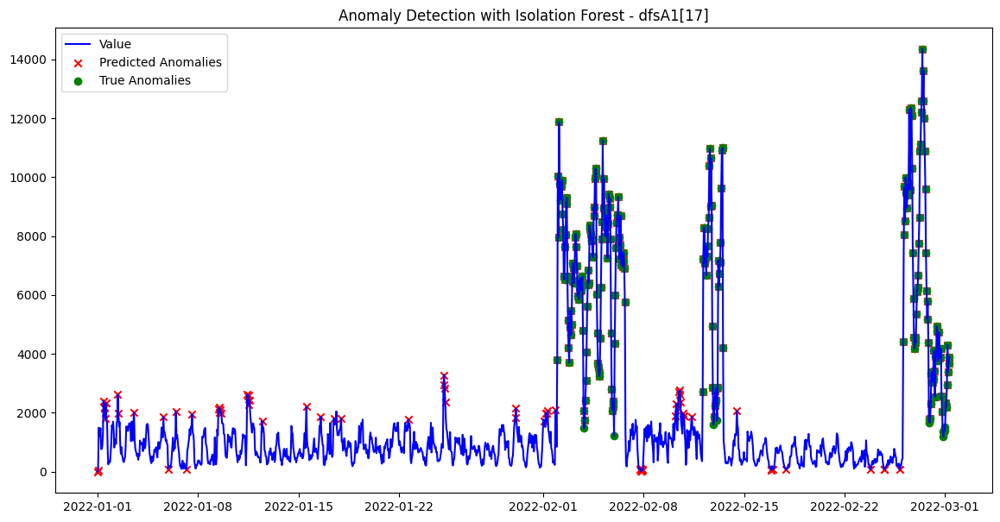

Processing dataset dfsA1[19]...
Best F1 Score for dfsA1[19]: 0.8465
Best Precision: 0.7651
Best Recall: 0.9471
Best Parameters: {'contamination': 0.2, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 200, 'random_state': 42}


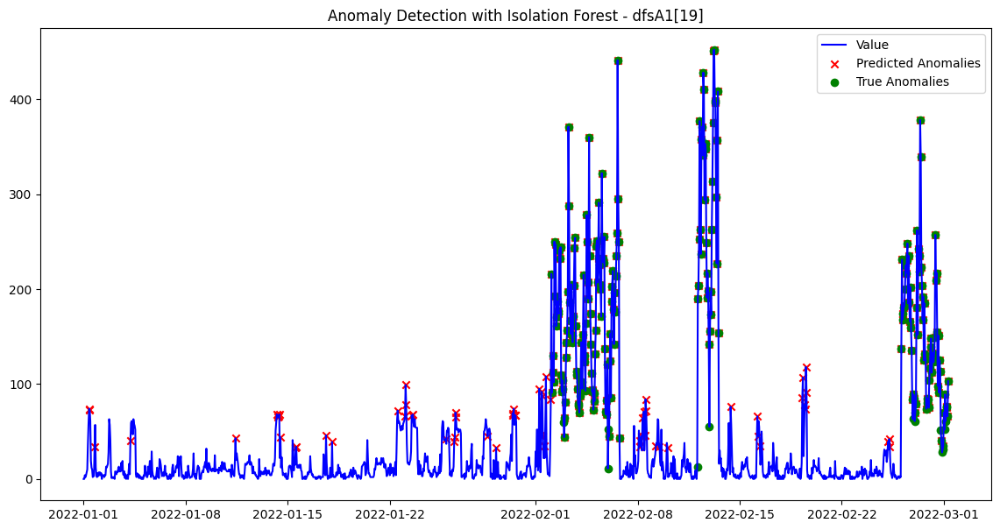

Processing dataset dfsA1[26]...
Best F1 Score for dfsA1[26]: 0.4323
Best Precision: 0.2757
Best Recall: 1.0000
Best Parameters: {'contamination': 'auto', 'max_features': 1, 'max_samples': 0.5, 'n_estimators': 100, 'random_state': 42}


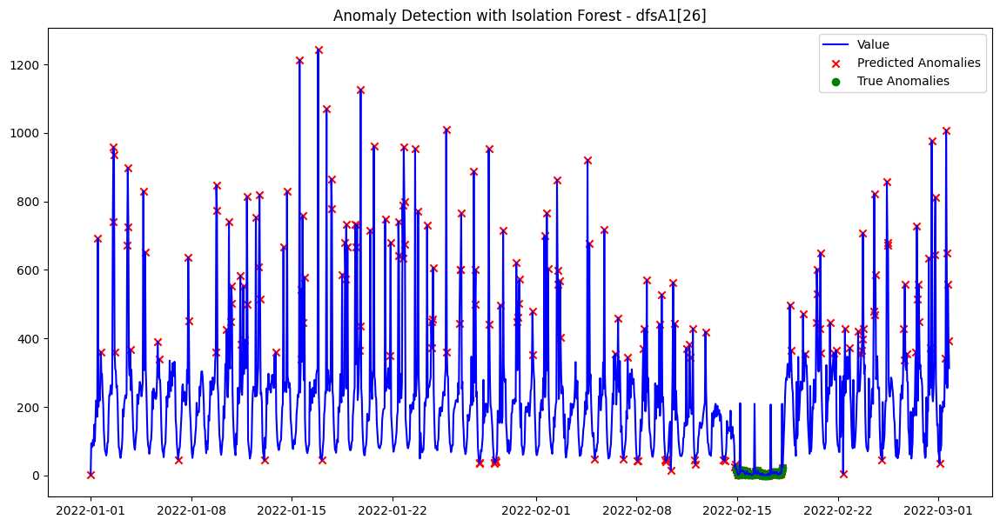

Processing dataset dfsA1[37]...
Best F1 Score for dfsA1[37]: 0.1521
Best Precision: 0.0823
Best Recall: 1.0000
Best Parameters: {'contamination': 'auto', 'max_features': 1, 'max_samples': 0.5, 'n_estimators': 50, 'random_state': 42}


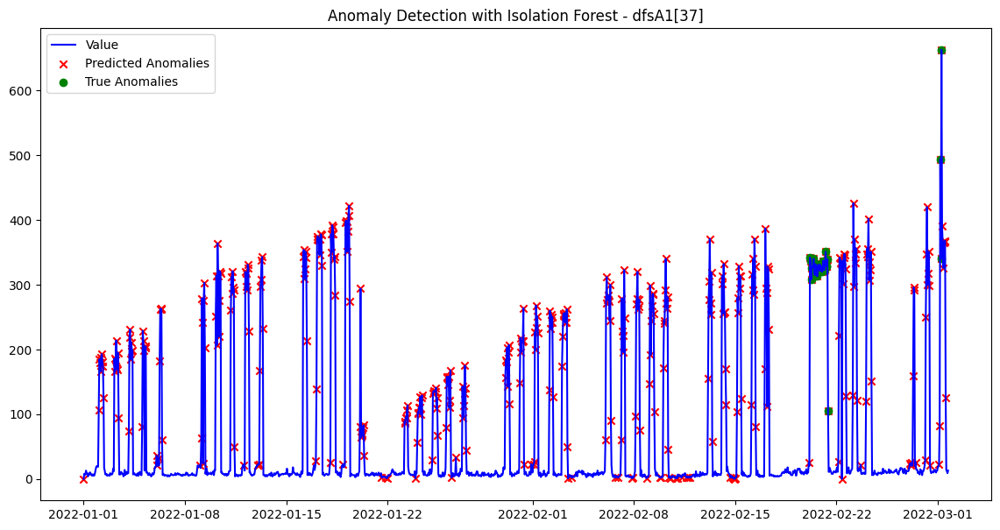

Processing dataset dfsA1[40]...
Best F1 Score for dfsA1[40]: 0.5022
Best Precision: 0.3916
Best Recall: 0.7000
Best Parameters: {'contamination': 0.1, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 100, 'random_state': 42}


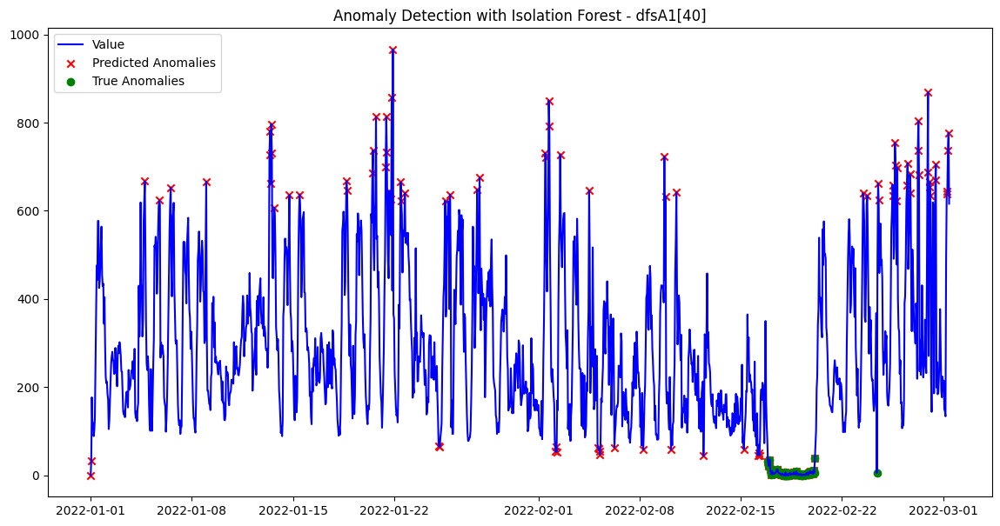

Processing dataset dfsA1[47]...
Best F1 Score for dfsA1[47]: 0.0800
Best Precision: 0.0667
Best Recall: 0.1000
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


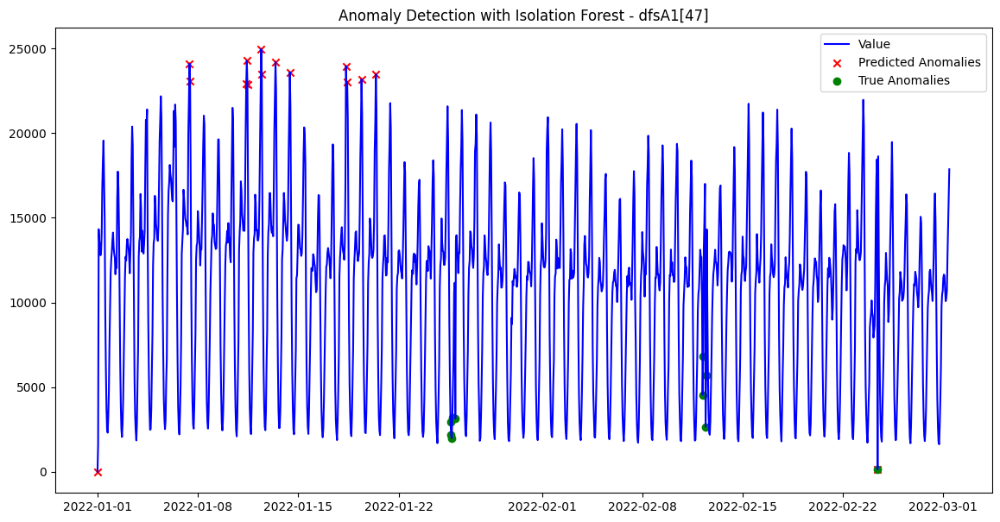

Average F1 Score across all datasets: 0.4768
Average Precision across all datasets: 0.3905
Average Recall across all datasets: 0.7838
All F1 Scores for each dataset: 0.8477, 0.8465, 0.4323, 0.1521, 0.5022, 0.0800


In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1C = [17, 19, 26, 37, 40, 47]
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_samples': ['auto', 0.5, 0.75],
    'contamination': ['auto',0.01, 0.05, 0.1, 0.2, 0.3],
    'max_features': [1],
    'random_state': [42]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1C:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = dfsA1[i]

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
       # if params['contamination'] == 'auto':
       #     params['contamination'] = contamination

        # Train Isolation Forest with current parameters
        isolation_forest = IsolationForest(
            n_estimators=params['n_estimators'],
            max_samples=params['max_samples'],
            contamination=params['contamination'],
            max_features=params["max_features"],
            random_state=params['random_state']
        )
        predictions = isolation_forest.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with Isolation Forest - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


### Yahoo A1D - Seasonality, trend and shift



## TEMP

Processing dataset dfsA1[28]...
Best F1 Score for dfsA1[28]: 0.5089
Best Precision: 0.4014
Best Recall: 0.6951
Best Parameters: {'contamination': 0.1, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 100, 'random_state': 42}


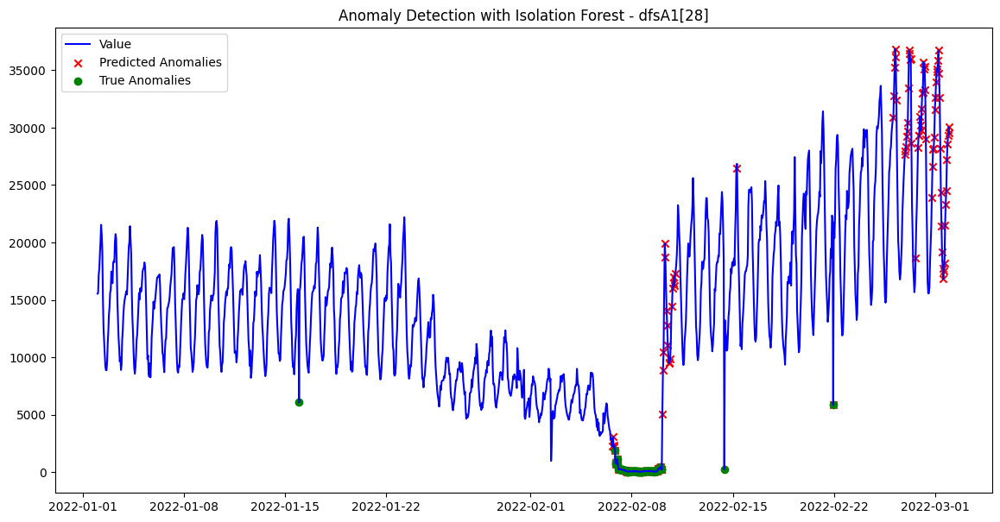

Processing dataset dfsA1[43]...
Best F1 Score for dfsA1[43]: 0.5437
Best Precision: 0.3944
Best Recall: 0.8750
Best Parameters: {'contamination': 0.05, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


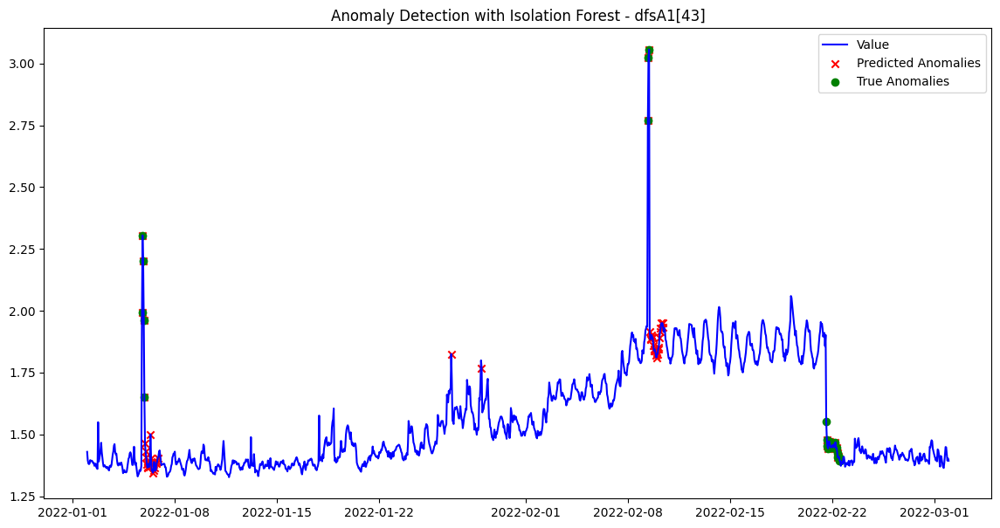

Processing dataset dfsA1[46]...
Best F1 Score for dfsA1[46]: 0.6295
Best Precision: 0.5563
Best Recall: 0.7248
Best Parameters: {'contamination': 0.1, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 200, 'random_state': 42}


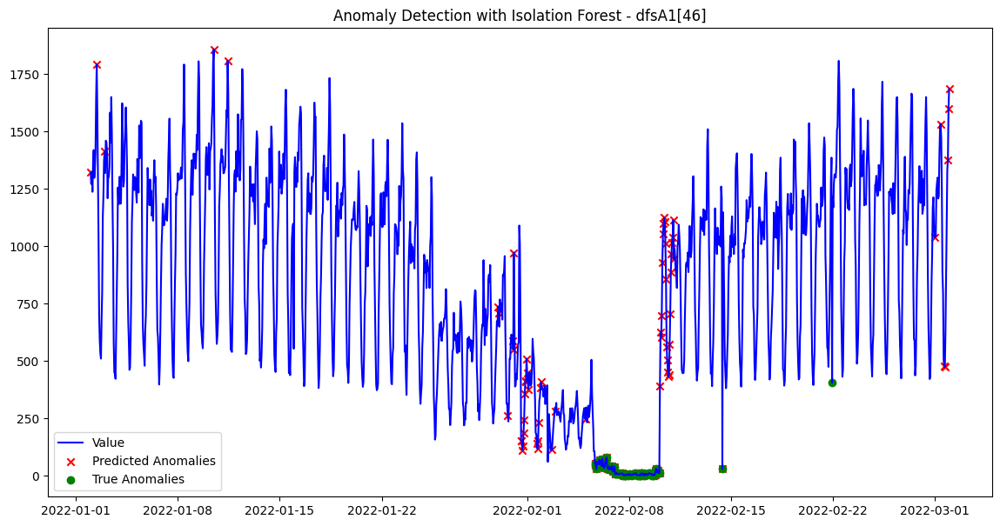

Processing dataset dfsA1[55]...
Best F1 Score for dfsA1[55]: 0.3000
Best Precision: 0.2000
Best Recall: 0.6000
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 0.75, 'n_estimators': 50, 'random_state': 42}


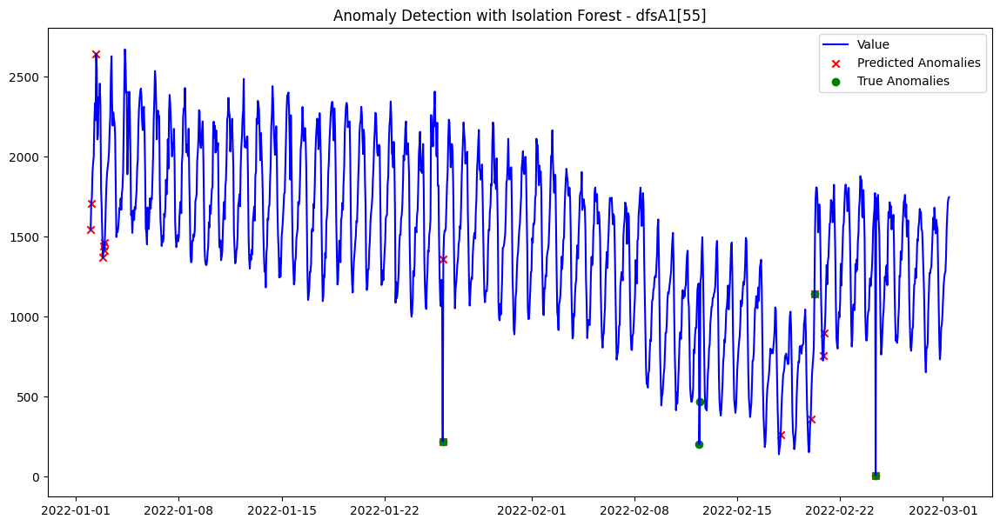

Processing dataset dfsA1[56]...
Best F1 Score for dfsA1[56]: 0.3000
Best Precision: 0.2000
Best Recall: 0.6000
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 0.75, 'n_estimators': 50, 'random_state': 42}


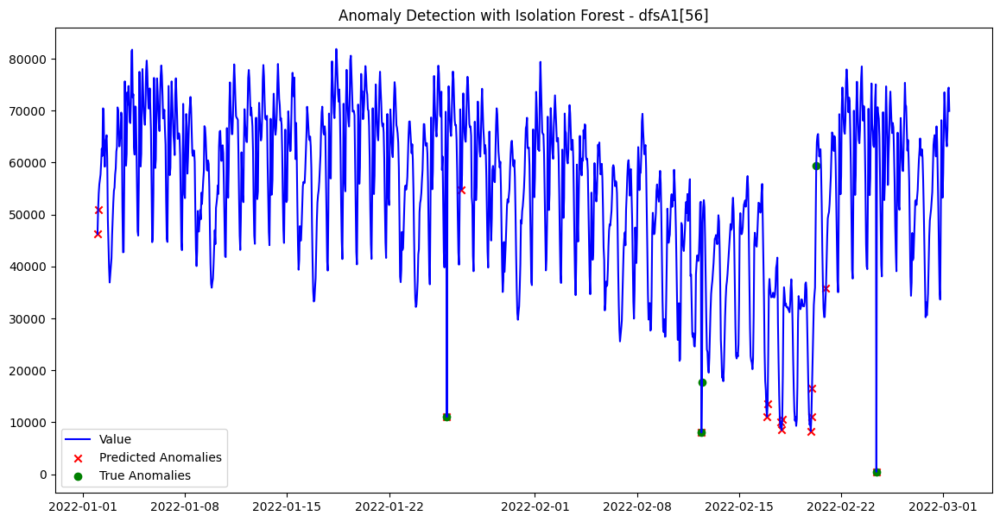

Processing dataset dfsA1[65]...
Best F1 Score for dfsA1[65]: 0.3226
Best Precision: 0.3571
Best Recall: 0.2941
Best Parameters: {'contamination': 0.01, 'max_features': 12, 'max_samples': 0.5, 'n_estimators': 100, 'random_state': 42}


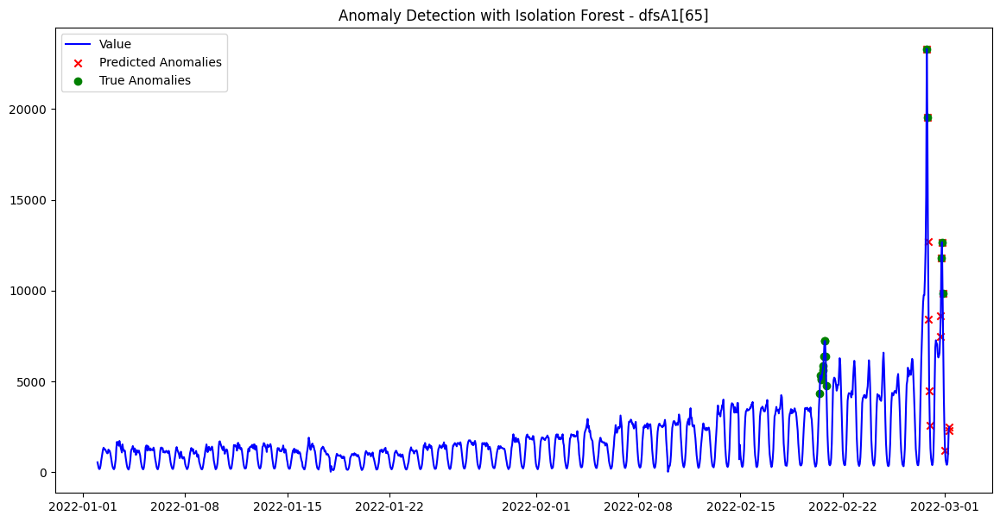

Average F1 Score across all datasets: 0.4341
Average Precision across all datasets: 0.3515
Average Recall across all datasets: 0.6315
All F1 Scores for each dataset: 0.5089, 0.5437, 0.6295, 0.3000, 0.3000, 0.3226


In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1D = [28,43,46,55,56,65]
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_samples': ['auto', 0.5, 0.75],
    'contamination': ['auto',0.01, 0.05, 0.1, 0.2, 0.3],
    'max_features': [12],
    'random_state': [42]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1D:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = feature_engineering(dfsA1[i], value_col=f"value_{i}", window_size=24)

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
       # if params['contamination'] == 'auto':
       #     params['contamination'] = contamination

        # Train Isolation Forest with current parameters
        isolation_forest = IsolationForest(
            n_estimators=params['n_estimators'],
            max_samples=params['max_samples'],
            contamination=params['contamination'],
            max_features=params["max_features"],
            random_state=params['random_state']
        )
        predictions = isolation_forest.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with Isolation Forest - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


## NOT TEMP

Processing dataset dfsA1[28]...
Best F1 Score for dfsA1[28]: 0.4324
Best Precision: 0.2778
Best Recall: 0.9756
Best Parameters: {'contamination': 0.2, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 100, 'random_state': 42}


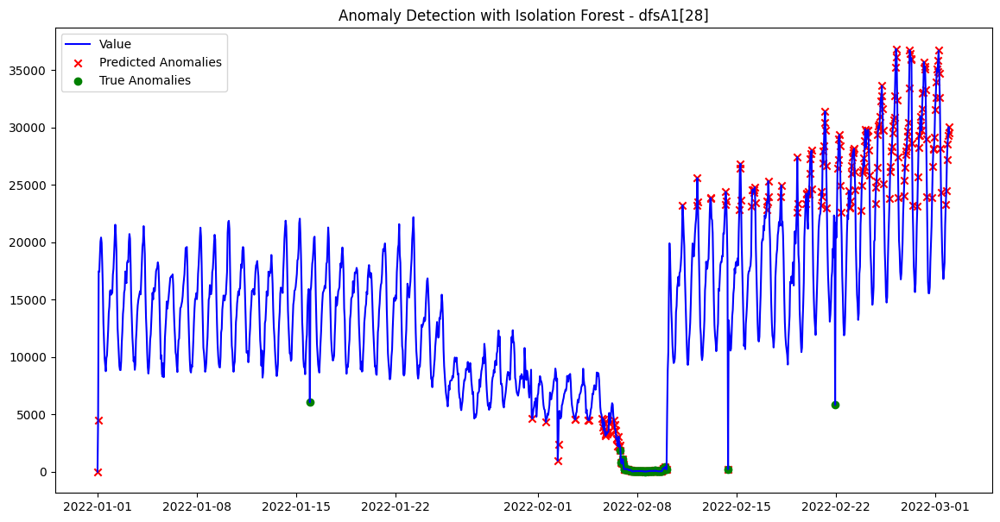

Processing dataset dfsA1[43]...
Best F1 Score for dfsA1[43]: 0.2553
Best Precision: 0.4000
Best Recall: 0.1875
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


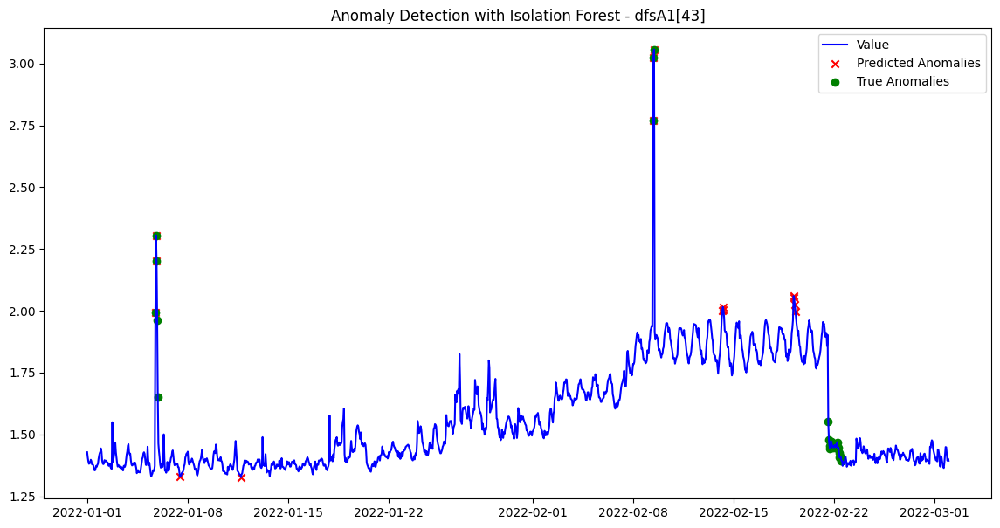

Processing dataset dfsA1[46]...
Best F1 Score for dfsA1[46]: 0.5441
Best Precision: 0.3750
Best Recall: 0.9908
Best Parameters: {'contamination': 0.2, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 100, 'random_state': 42}


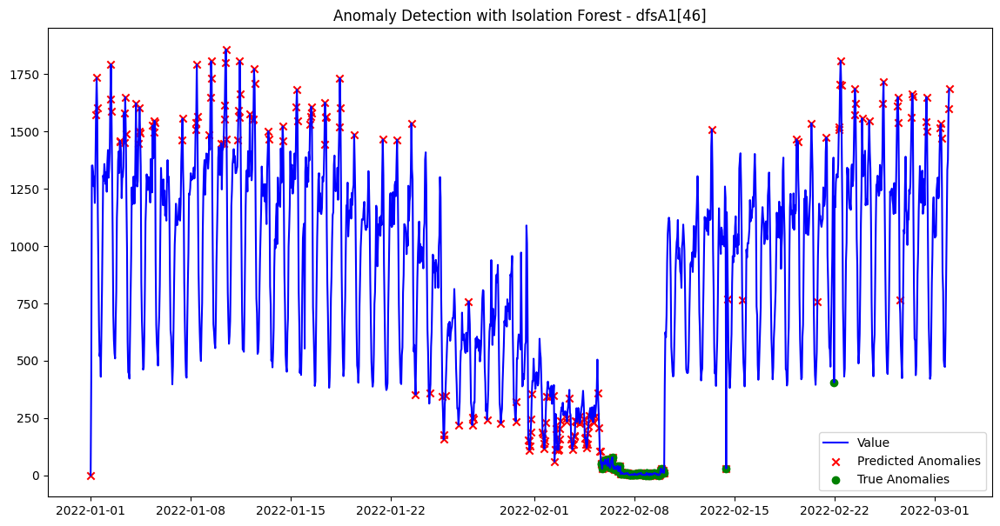

Processing dataset dfsA1[55]...
Best F1 Score for dfsA1[55]: 0.2000
Best Precision: 0.1333
Best Recall: 0.4000
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


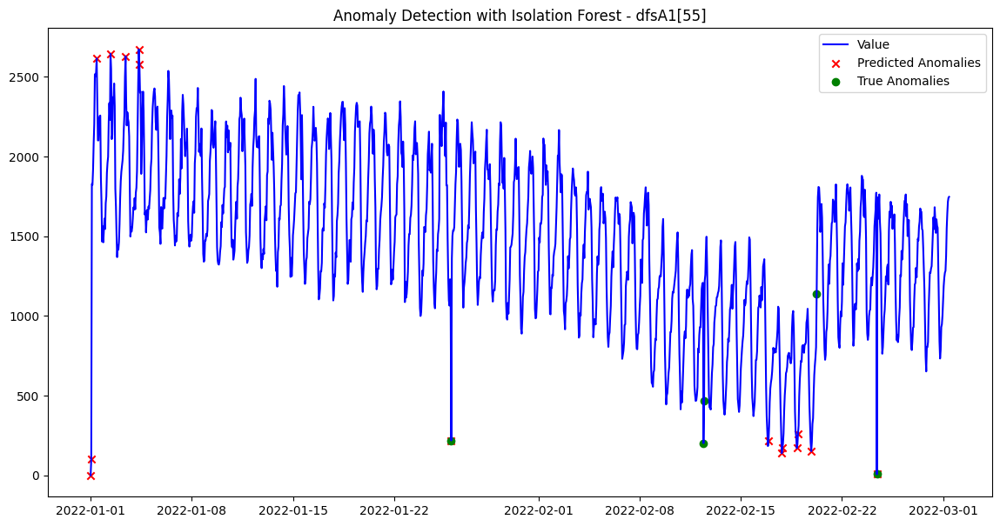

Processing dataset dfsA1[56]...
Best F1 Score for dfsA1[56]: 0.2000
Best Precision: 0.1333
Best Recall: 0.4000
Best Parameters: {'contamination': 0.01, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


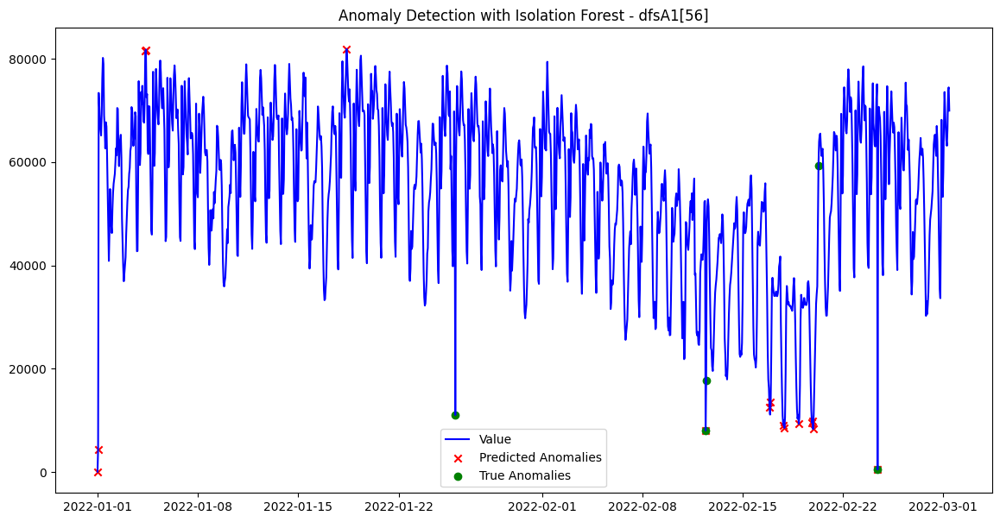

Processing dataset dfsA1[65]...
Best F1 Score for dfsA1[65]: 0.3596
Best Precision: 0.2222
Best Recall: 0.9412
Best Parameters: {'contamination': 0.05, 'max_features': 1, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


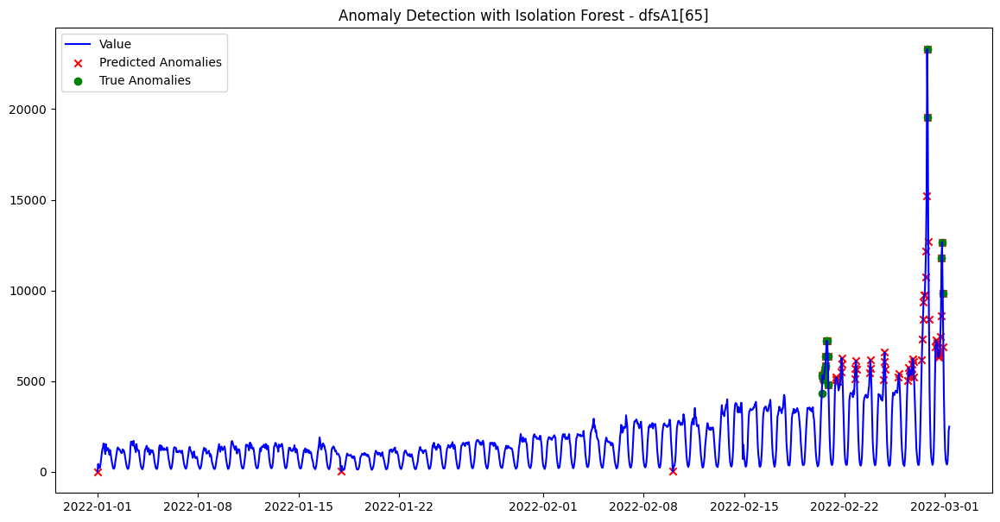

Average F1 Score across all datasets: 0.3319
Average Precision across all datasets: 0.2569
Average Recall across all datasets: 0.6492
All F1 Scores for each dataset: 0.4324, 0.2553, 0.5441, 0.2000, 0.2000, 0.3596


In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define A1A and ParameterGrid for hyperparameter tuning
A1D = [28,43,46,55,56,65]

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_samples': ['auto', 0.5, 0.75],
    'contamination': ['auto',0.01, 0.05, 0.1, 0.2, 0.3],
    'max_features': [1],
    'random_state': [42]
}
grid = ParameterGrid(param_grid)

# To calculate the average F1 score, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through datasets
for i in A1D:
    print(f"Processing dataset dfsA1[{i}]...")

    # Feature engineering (you'll need to implement this function)
    data_features = dfsA1[i]

    # Separate features and labels
    X = data_features.drop(columns=['label'])  # Drop the label column
    y = data_features['label']  # Ground truth labels

    # Standardize features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
       # if params['contamination'] == 'auto':
       #     params['contamination'] = contamination

        # Train Isolation Forest with current parameters
        isolation_forest = IsolationForest(
            n_estimators=params['n_estimators'],
            max_samples=params['max_samples'],
            contamination=params['contamination'],
            max_features=params["max_features"],
            random_state=params['random_state']
        )
        predictions = isolation_forest.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate metrics
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_precision = precision
            best_recall = recall
            best_params = params
            best_predictions = predictions

    # Append best metrics for the dataset
    f1_scores.append(best_f1)
    precision_scores.append(best_precision)
    recall_scores.append(best_recall)

    # Output best parameters and metrics for current dataset
    print(f"Best F1 Score for dfsA1[{i}]: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features[f"value_{i}"], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1][f"value_{i}"],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1][f"value_{i}"],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with Isolation Forest - dfsA1[{i}]')
    plt.legend()
    plt.show()

# Calculate and output the average metrics
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision = sum(precision_scores) / len(precision_scores)
avg_recall = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all datasets: {avg_f1_score:.4f}")
print(f"Average Precision across all datasets: {avg_precision:.4f}")
print(f"Average Recall across all datasets: {avg_recall:.4f}")
# Print each F1 score formatted individually
formatted_f1_scores = [f"{score:.4f}" for score in f1_scores]
print(f"All F1 Scores for each dataset: {', '.join(formatted_f1_scores)}")


## Problem with Rolling windows using sklearn IForest

F1 Score (Rolling Window): 0.0580


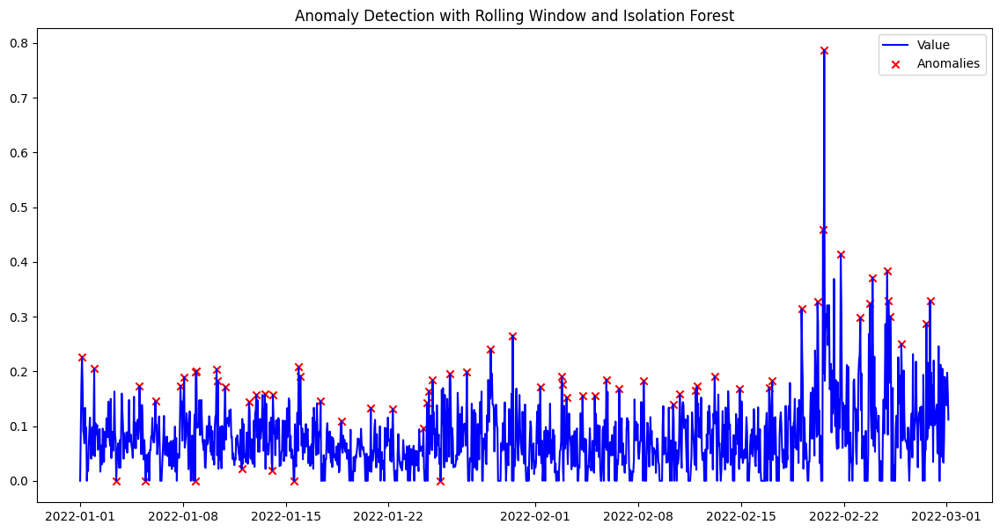

In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
import numpy as np
import matplotlib.pyplot as plt

# Parameters for rolling window
window_size = 50  # Define the rolling window size
step_size = 1  # Step size for the rolling window

# 1. Extract the target feature and label
values = dfsA1[1]['value_1'].values
labels = dfsA1[1]['label'].values

# 2. Prepare arrays to store predictions
rolling_predictions = np.zeros(len(values))  # Array to store anomaly predictions

# 3. Loop through data in a rolling window
for start in range(0, len(values) - window_size + 1, step_size):
    end = start + window_size
    window_values = values[start:end]
    window_labels = labels[start:end]

    # Reshape the window for IsolationForest
    window_features = window_values.reshape(-1, 1)
    scaler = StandardScaler()
    window_scaled = scaler.fit_transform(window_features)

    # Estimate contamination for the window
    contamination = np.sum(window_labels) / len(window_labels)

    # Train Isolation Forest on the current window
    isolation_forest = IsolationForest(
        n_estimators=100,
        contamination=contamination,
        random_state=42
    )
    window_predictions = isolation_forest.fit_predict(window_scaled)

    # Map predictions (-1 = anomaly, 1 = normal) to binary (1 = anomaly, 0 = normal)
    window_predictions = [1 if pred == -1 else 0 for pred in window_predictions]

    # Assign predictions back to the main array
    rolling_predictions[start:end] = np.maximum(rolling_predictions[start:end], window_predictions)

# 4. Calculate F1 score
f1 = f1_score(labels, rolling_predictions)

# 5. Output F1 score
print(f"F1 Score (Rolling Window): {f1:.4f}")

# 6. Add predictions to the original DataFrame for inspection
dfsA1[1]['rolling_predictions'] = rolling_predictions

# 7. Visualize anomalies
plt.figure(figsize=(14, 7))
plt.plot(dfsA1[1].index, dfsA1[1]['value_1'], label='Value', color='blue')
plt.scatter(dfsA1[1][dfsA1[1]['rolling_predictions'] == 1].index,
            dfsA1[1][dfsA1[1]['rolling_predictions'] == 1]['value_1'],
            color='red', label='Anomalies', marker='x')

plt.title('Anomaly Detection with Rolling Window and Isolation Forest')
plt.legend()
plt.show()


In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
import numpy as np
import matplotlib.pyplot as plt

# Parameters for rolling window
window_size = 50  # Define the rolling window size
step_size = 1  # Step size for the rolling window

# 1. Extract the target feature and label
values = dfsA1[1]['value_1'].values
labels = dfsA1[1]['label'].values

# Scale the entire series once
scaler = StandardScaler()
values_scaled = scaler.fit_transform(values.reshape(-1, 1))

# Rolling window predictions
rolling_predictions = np.zeros(len(values))  # Store predictions

for start in range(0, len(values) - window_size + 1, step_size):
    end = start + window_size
    window_values = values_scaled[start:end]
    window_labels = labels[start:end]

    # Dynamically estimate contamination
    contamination = np.sum(window_labels) / len(window_labels)
    contamination = max(min(contamination, 0.5), 0.01)  # Cap contamination between 0.01 and 0.5

    # Train Isolation Forest on the window
    isolation_forest = IsolationForest(
        n_estimators=100,
        contamination=contamination,
        random_state=42
    )
    window_predictions = isolation_forest.fit_predict(window_values)

    # Map predictions (-1 = anomaly, 1 = normal) to binary
    window_predictions = [1 if pred == -1 else 0 for pred in window_predictions]

    # Assign predictions to the center of the window
    center = start + window_size // 2
    rolling_predictions[center] = max(rolling_predictions[center], max(window_predictions))

# Calculate F1 score
f1 = f1_score(labels, rolling_predictions)
print(f"F1 Score (Rolling Window): {f1:.4f}")


F1 Score (Rolling Window): 0.0030


## NAB

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=pd.errors.SettingWithCopyWarning)


data = {}
path = '/content/drive/My Drive/NAB/data'

def addFolderAndReadAll(f_name):
    data[f_name] = {}
    csvs = os.listdir(path + '/' + f_name)
    csvs_num = 0
    for csv in csvs:
        data[f_name][csv] = pd.read_csv(path + '/' + f_name + '/' + csv)
        csvs_num += 1
    return csvs_num

csvs_num = sum([addFolderAndReadAll(f_name) for f_name in os.listdir(path)])

with open('/content/drive//My Drive/NAB/labels/combined_windows.json', 'r') as file:
    labels = json.load(file)

for key1 in data:
    for key2 in data[key1]:
        one_csv_labels = labels[key1+'/'+key2]
        data[key1][key2]['label'] = np.array(0)
        num = 0
        for interval in one_csv_labels:
            #print(key2, interval, num)
            index1 = list(data[key1][key2]['timestamp']).index(interval[0][:19])
            index2 = list(data[key1][key2]['timestamp']).index(interval[1][:19])
            data[key1][key2]['label'][num] = slice(index1, index2)
            #data[key1][key2]['label'] = data[key1][key2]['label'].apply(lambda x: 1 if isinstance(x, slice) else 0)
            num += 1

In [ ]:
import os
import pandas as pd
import numpy as np
import json

data = {}
path = '/content/drive/My Drive/NAB/data'

# Load all CSV files into a nested dictionary
def addFolderAndReadAll(f_name):
    data[f_name] = {}
    csvs = os.listdir(path + '/' + f_name)
    csvs_num = 0
    for csv in csvs:
        data[f_name][csv] = pd.read_csv(path + '/' + f_name + '/' + csv)
        csvs_num += 1
    return csvs_num

# Read data from all folders
csvs_num = sum([addFolderAndReadAll(f_name) for f_name in os.listdir(path)])

# Load anomaly intervals from JSON
with open('/content/drive/My Drive/NAB/labels/combined_windows.json', 'r') as file:
    labels = json.load(file)

# Process each CSV and assign binary labels
for key1 in data:
    for key2 in data[key1]:
        one_csv_labels = labels[key1 + '/' + key2]
        df = data[key1][key2]
        df['label'] = 0  # Initialize label column with 0

        # Mark intervals as anomalies
        for interval in one_csv_labels:
            index1 = list(df['timestamp']).index(interval[0][:19])
            index2 = list(df['timestamp']).index(interval[1][:19])
            df.loc[index1:index2, 'label'] = 1  # Set rows within interval to 1

        # Update the DataFrame back into the data dictionary
        data[key1][key2] = df

# All `data` dictionaries now have binary labels.

In [ ]:
import math

def sigmoid(x):
    """Standard sigmoid function."""
    return 1 / (1 + math.exp(-x))

def sigmoid_score(t, A_tp, A_fp):
    """
    Calculate the scaled sigmoid score for a detection.
    @param t: Relative position of the detection:
              - t = -1 is far left of the window, t = 0 is the right edge.
              - t > 0 considers detections outside the window.
    @param A_tp: Reward for true positives.
    @param A_fp: Penalty for false positives.
    """
    if t > 3.0:
        return -1.0  # Assign -1 for detections too far after the window
    elif 0 < t <= 3.0:
        return  2* (1 / (1 + math.exp(5 * t))) - 1.0  # Sigmoid scaling
    else:
        return  2* (1 / (1 + math.exp(5 * t))) - 1.0  # Normal sigmoid for in-window cases

def compute_raw_score_debug(detections, anomaly_windows, A_tp, A_fp, A_fn):
    """
    Compute the raw NAB score for a dataset with detailed debugging.
    Also computes S_perfect and S_null for comparison.
    @param detections: List of detected anomaly timestamps.
    @param anomaly_windows: List of anomaly windows (start_time, end_time).
    @param A_tp: Reward for true positives.
    @param A_fp: Penalty for false positives.
    @param A_fn: Penalty for missed anomaly windows (false negatives).

    @return: Raw NAB score, S_perfect, S_null.
    """
    score = 0
    missed_windows = 0


    # Sort detections and anomaly windows
    detections = sorted(detections)
    anomaly_windows = sorted(anomaly_windows, key=lambda x: x[0])

    # Compute the actual score
    for i, window in enumerate(anomaly_windows):
        start_time, end_time = window
        window_length = end_time - start_time

        # Find detections within or after the current window
        detections_in_window = [d for d in detections if d >= start_time]

        if detections_in_window and start_time <= detections_in_window[0] <= end_time:
            # Detection within the window
            first_detection = detections_in_window[0]
            t = -3 + 2 * (first_detection - start_time) / window_length
            contribution = sigmoid_score(t, A_tp, A_fp)
            print(f"Window {i}: {window}, Detection t={t:.3f}, Contribution={contribution:.3f}")
            score += contribution
            # Remove the detection
            detections.remove(first_detection)
            detections_in_window = [d for d in detections if start_time <= d <= end_time]
            for d in detections_in_window:
                detections.remove(d)


        elif detections_in_window:
            # Check all detections just outside the current window
            near_miss_detections = [d for d in detections_in_window if 0 < (d - end_time) <= 3.0]

            for near_detection in near_miss_detections:
                t = (near_detection - end_time)  # Relative position after the window
                contribution = sigmoid_score(t, A_tp, A_fp)
                print(f"Window {i}: {window}, Near-miss detection t={t:.3f}, Contribution={contribution:.3f}")
                score += contribution
                # Remove the detection after scoring it
                detections.remove(near_detection)
        else:
            # No detections in this window - count as a false negative
            print(f"Window {i}: {window}, Missed anomaly window. Penalty={A_fn:.3f}")
            score += A_fn
            missed_windows += 1

    # Handle remaining detections as false positives or outside windows
    for detection in detections:
        # Check if detection is close to the end of any window
        near_miss_found = False
        for window in anomaly_windows:
            _, end_time = window
            if 0 < (detection - end_time) <= 3.0:
                t = (detection - end_time)
                contribution = sigmoid_score(t, A_tp, A_fp)
                print(f"Detection {detection} near-miss outside any window. t={t:.3f}, Contribution={contribution:.3f}")
                score += contribution
                near_miss_found = True
                break

        if not near_miss_found:
            # Treat as a false positive
            contribution = sigmoid_score(3.0, A_tp, A_fp)  # Use t=3.0 for far detections
            print(f"False positive detection at {detection}, Contribution={contribution:.3f}")
            score += contribution

    print(f"Raw score for dataset: {score:.3f}")

    return score

In [ ]:
def create_anomaly_windows(binary_labels):
    """
    Generate an array of anomaly windows (start, end) tuples from binary labels.

    @param binary_labels: List or array of binary labels (0s and 1s).
                          1 indicates an anomaly, 0 indicates normal.

    @return: List of tuples where each tuple is (start_index, end_index) for an anomaly window.
    """
    anomaly_windows = []
    in_window = False
    start_index = None

    for i, label in enumerate(binary_labels):
        if label == 1 and not in_window:
            # Start of a new anomaly window
            start_index = i
            in_window = True
        elif label == 0 and in_window:
            # End of the current anomaly window
            end_index = i - 1
            anomaly_windows.append((start_index, end_index))
            in_window = False

    # If the last label is part of an anomaly window, close it
    if in_window:
        anomaly_windows.append((start_index, len(binary_labels) - 1))

    return anomaly_windows


In [ ]:
anomaly_windows = {}
binary_labels = data["realKnownCause"]["nyc_taxi.csv"]["label"]
# Generate the anomaly windows for the current labels
anomaly_windows["nyc_taxi.csv"] = create_anomaly_windows(binary_labels)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Perform feature engineering
def feature_engineering_nab(df, value_col, window_size):
    df = df.copy()

    if not isinstance(df.index, pd.DatetimeIndex):
      df['timestamp'] = pd.to_datetime(df['timestamp'])  # Assuming 'timestamp' is the datetime column
      df.set_index('timestamp', inplace=True)

    # Rolling statistics
    df[f'rolling_mean_{window_size}'] = df[value_col].rolling(window=window_size).mean()
    df[f'rolling_std_{window_size}'] = df[value_col].rolling(window=window_size).std()
    df[f'rolling_min_{window_size}'] = df[value_col].rolling(window=window_size).min()
    df[f'rolling_max_{window_size}'] = df[value_col].rolling(window=window_size).max()

    # Time-based features
    df['hour'] = df.index.hour
    df['day_of_week'] = df.index.weekday
    df['day_of_month'] = df.index.day
    df['month'] = df.index.month
    df['Lag'] = df[value_col].shift(48)

    # Sinusoidal encoding for capturing daily seasonality
    df['sin_day'] = np.sin(2 * np.pi * df.index.hour / 48)
    df['cos_day'] = np.cos(2 * np.pi * df.index.hour / 48)
    # Drop rows with NaN due to rolling statistics
    df.dropna(inplace=True)
    return df

## temp

Η έξοδος ροής περικόπηκε στις τελευταίες 5000 γραμμές.
False positive detection at 2591, Contribution=-1.000
False positive detection at 2592, Contribution=-1.000
False positive detection at 2593, Contribution=-1.000
False positive detection at 2594, Contribution=-1.000
False positive detection at 2595, Contribution=-1.000
False positive detection at 2596, Contribution=-1.000
False positive detection at 2597, Contribution=-1.000
False positive detection at 2638, Contribution=-1.000
False positive detection at 2639, Contribution=-1.000
False positive detection at 2832, Contribution=-1.000
False positive detection at 2833, Contribution=-1.000
False positive detection at 2842, Contribution=-1.000
False positive detection at 2878, Contribution=-1.000
False positive detection at 2879, Contribution=-1.000
False positive detection at 2880, Contribution=-1.000
False positive detection at 2881, Contribution=-1.000
False positive detection at 2882, Contribution=-1.000
False positive detection at

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Detection t=-2.350, Contribution=1.000
Window 4: (9977, 10183), Detection t=-2.485, Contribution=1.000
Raw score for dataset: 2.000
Window 0: (5839, 6045), Detection t=-2.350, Contribution=1.000
Window 2: (8423, 8629), Detection t=-2.311, Contribution=1.000
Window 4: (9977, 10183), Detection t=-2.495, Contribution=1.000
Raw score for dataset: 3.000
Window 0: (5839, 6045), Detection t=-2.350, Contribution=1.000
Window 2: (8423, 8629), Detection t=-2.301, Contribution=1.000
Window 3: (8731, 8937), Detection t=-2.456, Contribution=1.000
Window 4: (9977, 10183), Detection t=-2.495, Contribution=1.000
False positive detection at 9263, Contribution=-1.000
Raw score for dataset: 3.000
Window 0: (5839, 6045), Detection t=-2.350, Contribution=1.000
Window 2: (8423, 8629), Detection t=-2.301, Contribution=1.000
Window 4: (9977, 10183), Detection t=-2.495, Contribution=1.000
Raw score for dataset: 3.000
Window 0: (5839, 6045), Detection t=-2.466, Contribution=1.000
Window 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Detection t=-2.350, Contribution=1.000
Window 1: (7080, 7286), Detection t=-2.320, Contribution=1.000
Window 2: (8423, 8629), Detection t=-2.369, Contribution=1.000
Window 3: (8731, 8937), Detection t=-2.019, Contribution=1.000
Window 4: (9977, 10183), Detection t=-2.495, Contribution=1.000
False positive detection at 5232, Contribution=-1.000
False positive detection at 8639, Contribution=-1.000
False positive detection at 8976, Contribution=-1.000
False positive detection at 8977, Contribution=-1.000
False positive detection at 8978, Contribution=-1.000
False positive detection at 8979, Contribution=-1.000
False positive detection at 9262, Contribution=-1.000
False positive detection at 9263, Contribution=-1.000
False positive detection at 9264, Contribution=-1.000
False positive detection at 10262, Contribution=-1.000
Raw score for dataset: -5.000
Window 0: (5839, 6045), Detection t=-2.350, Contribution=1.000
Window 1: (7080, 7286), Detection t=-2.291, Contri

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Detection t=-2.738, Contribution=1.000
Window 1: (7080, 7286), Detection t=-2.398, Contribution=1.000
Window 2: (8423, 8629), Detection t=-2.398, Contribution=1.000
Window 3: (8731, 8937), Detection t=-2.485, Contribution=1.000
Window 4: (9977, 10183), Detection t=-2.942, Contribution=1.000
False positive detection at 86, Contribution=-1.000
False positive detection at 144, Contribution=-1.000
False positive detection at 145, Contribution=-1.000
False positive detection at 188, Contribution=-1.000
False positive detection at 192, Contribution=-1.000
False positive detection at 193, Contribution=-1.000
False positive detection at 237, Contribution=-1.000
False positive detection at 238, Contribution=-1.000
False positive detection at 239, Contribution=-1.000
False positive detection at 241, Contribution=-1.000
False positive detection at 242, Contribution=-1.000
False positive detection at 243, Contribution=-1.000
False positive detection at 252, Contribution=-1.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Η έξοδος ροής περικόπηκε στις τελευταίες 5000 γραμμές.
False positive detection at 9647, Contribution=-1.000
False positive detection at 9648, Contribution=-1.000
False positive detection at 9649, Contribution=-1.000
False positive detection at 9650, Contribution=-1.000
False positive detection at 9651, Contribution=-1.000
False positive detection at 9692, Contribution=-1.000
False positive detection at 9693, Contribution=-1.000
False positive detection at 9694, Contribution=-1.000
False positive detection at 9695, Contribution=-1.000
False positive detection at 9696, Contribution=-1.000
False positive detection at 9697, Contribution=-1.000
False positive detection at 9698, Contribution=-1.000
False positive detection at 9699, Contribution=-1.000
False positive detection at 9703, Contribution=-1.000
False positive detection at 9704, Contribution=-1.000
False positive detection at 9706, Contribution=-1.000
False positive detection at 9707, Contribution=-1.000
False positive detection at

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Η έξοδος ροής περικόπηκε στις τελευταίες 5000 γραμμές.
False positive detection at 4611, Contribution=-1.000
False positive detection at 4612, Contribution=-1.000
False positive detection at 4654, Contribution=-1.000
False positive detection at 4655, Contribution=-1.000
False positive detection at 4656, Contribution=-1.000
False positive detection at 4657, Contribution=-1.000
False positive detection at 4703, Contribution=-1.000
False positive detection at 4800, Contribution=-1.000
False positive detection at 4801, Contribution=-1.000
False positive detection at 4894, Contribution=-1.000
False positive detection at 4895, Contribution=-1.000
False positive detection at 4896, Contribution=-1.000
False positive detection at 4897, Contribution=-1.000
False positive detection at 4898, Contribution=-1.000
False positive detection at 4908, Contribution=-1.000
False positive detection at 4909, Contribution=-1.000
False positive detection at 4910, Contribution=-1.000
False positive detection at

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Η έξοδος ροής περικόπηκε στις τελευταίες 5000 γραμμές.
False positive detection at 9287, Contribution=-1.000
False positive detection at 9288, Contribution=-1.000
False positive detection at 9289, Contribution=-1.000
False positive detection at 9290, Contribution=-1.000
False positive detection at 9291, Contribution=-1.000
False positive detection at 9292, Contribution=-1.000
False positive detection at 9293, Contribution=-1.000
False positive detection at 9294, Contribution=-1.000
False positive detection at 9295, Contribution=-1.000
False positive detection at 9296, Contribution=-1.000
False positive detection at 9297, Contribution=-1.000
False positive detection at 9298, Contribution=-1.000
False positive detection at 9299, Contribution=-1.000
False positive detection at 9300, Contribution=-1.000
False positive detection at 9301, Contribution=-1.000
False positive detection at 9302, Contribution=-1.000
False positive detection at 9303, Contribution=-1.000
False positive detection at

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Window 0: (5839, 6045), Missed anomaly window. Penalty=-1.000
Window 1: (7080, 7286), Missed anomaly window. Penalty=-1.000
Window 2: (8423, 8629), Missed anomaly window. Penalty=-1.000
Window 3: (8731, 8937), Missed anomaly window. Penalty=-1.000
Window 4: (9977, 10183), Missed anomaly window. Penalty=-1.000
Raw score for dataset: -5.000
Best F1 Score for nyc taxi: 0.0957
Best Precision: 1.0000
Best Recall: 0.0502
Best Parameters: {'contamination': 0.005, 'max_features': 12, 'max_samples': 0.75, 'n_estimators': 50}
best nab score: 3.9999423545745474


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


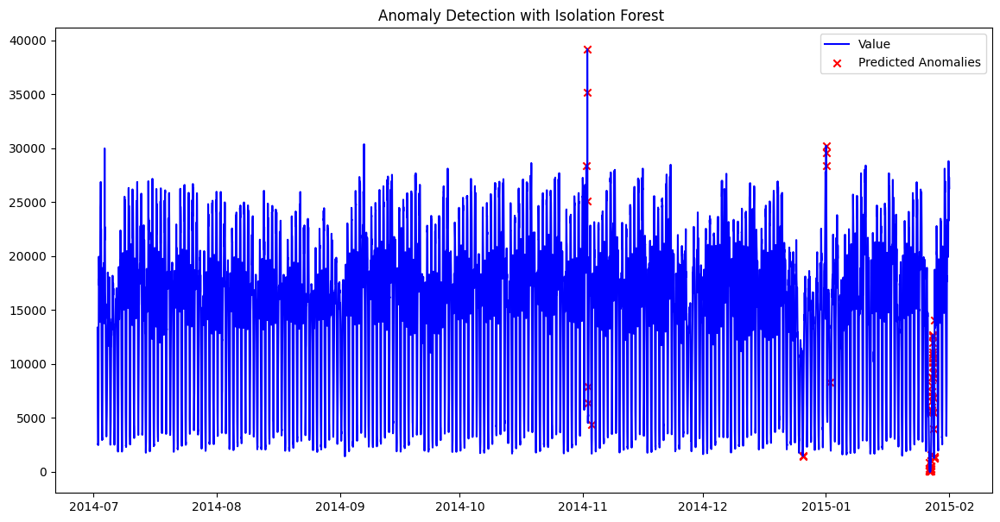

In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define ParameterGrid for hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100,200,300],
    'max_samples': ['auto', 0.5, 0.75,1],
    'contamination': ['auto', 0.005,0.01, 0.05, 0.1, 0.2, 0.3],
    "max_features": [12]
}
grid = ParameterGrid(param_grid)

# To calculate the F1 scores, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Load and perform feature engineering
data_features = feature_engineering_nab(data['realKnownCause']["nyc_taxi.csv"], "value", 48)

# Separate features and labels
X = data_features.drop("label", axis=1)
y = data_features['label']


# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Estimate contamination
contamination = y.sum() / len(y)

# Hyperparameter tuning using grid search
best_f1 = -1
best_nab = float('-inf')
best_params = None
best_predictions = None

for params in grid:
    # Update contamination dynamically if it's 'auto'
   # if params['contamination'] == 'auto':
   #     params['contamination'] = contamination

    # Train Isolation Forest with current parameters
    isolation_forest = IsolationForest(
        n_estimators=params['n_estimators'],
        max_samples=params['max_samples'],
        max_features = params['max_features'],
        contamination=params['contamination']
    )
    predictions = isolation_forest.fit_predict(X_scaled)

    # Map predictions to binary (1 = anomaly, 0 = normal)
    predictions = [1 if pred == -1 else 0 for pred in predictions]

    # Adjust detections by adding the offset
    detections = [i for i, x in enumerate(predictions) if x == 1]

    # Compute the NAB score
    nab_score = compute_raw_score_debug(detections, anomaly_windows["nyc_taxi.csv"], A_tp = 1.0, A_fp = -0.11, A_fn = -1.0)

    # Calculate metrics
    f1 = f1_score(y, predictions)
    precision = precision_score(y, predictions)
    recall = recall_score(y, predictions)

    # Update best parameters if current F1 is better
    if nab_score > best_nab:
        best_f1 = f1
        best_precision = precision
        best_recall = recall
        best_params = params
        best_predictions = predictions
        best_nab = nab_score


# Output best parameters and metrics for the current file
print(f"Best F1 Score for nyc taxi: {best_f1:.4f}")
print(f"Best Precision: {best_precision:.4f}")
print(f"Best Recall: {best_recall:.4f}")
print(f"Best Parameters: {best_params}")
print(f"best nab score: {best_nab}")


# Add predictions to the original DataFrame for inspection
data_features['predictions'] = best_predictions


# Visualize anomalies
plt.figure(figsize=(14, 7))
plt.plot(data_features.index, data_features['value'], label='Value', color='blue')
plt.scatter(data_features[data_features['predictions'] == 1].index,
            data_features[data_features['predictions'] == 1]['value'],
            color='red', label='Predicted Anomalies', marker='x')
#plt.scatter(data_features[data_features['label'] == 1].index,
#            data_features[data_features['label'] == 1]['value'],
#            color='green', label='True Anomalies', marker='o')

plt.title(f'Anomaly Detection with Isolation Forest ')
plt.legend()
plt.show()



## not temp

Η έξοδος ροής περικόπηκε στις τελευταίες 5000 γραμμές.
False positive detection at 1265, Contribution=-1.000
False positive detection at 1266, Contribution=-1.000
False positive detection at 1267, Contribution=-1.000
False positive detection at 1268, Contribution=-1.000
False positive detection at 1295, Contribution=-1.000
False positive detection at 1296, Contribution=-1.000
False positive detection at 1297, Contribution=-1.000
False positive detection at 1298, Contribution=-1.000
False positive detection at 1299, Contribution=-1.000
False positive detection at 1301, Contribution=-1.000
False positive detection at 1306, Contribution=-1.000
False positive detection at 1307, Contribution=-1.000
False positive detection at 1308, Contribution=-1.000
False positive detection at 1309, Contribution=-1.000
False positive detection at 1310, Contribution=-1.000
False positive detection at 1311, Contribution=-1.000
False positive detection at 1323, Contribution=-1.000
False positive detection at

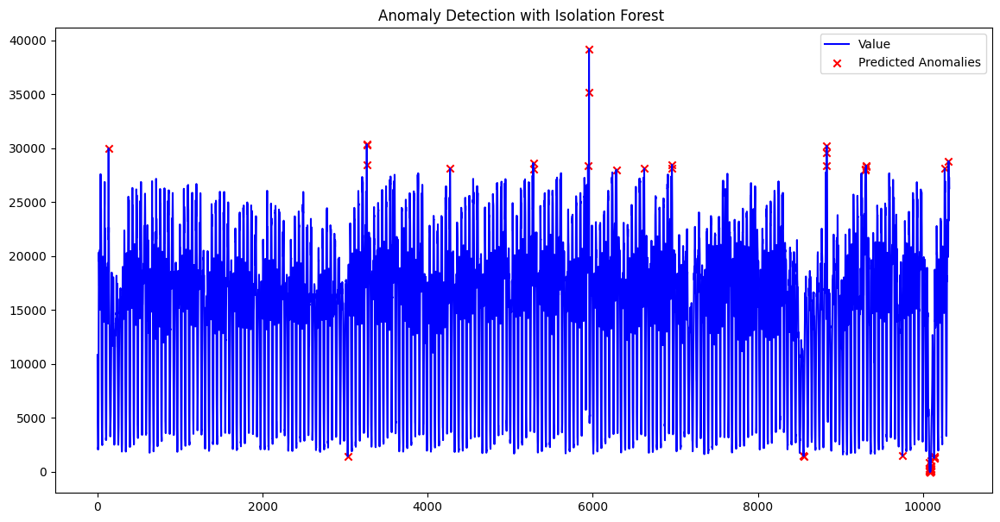

In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define ParameterGrid for hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100],
    'max_samples': ['auto', 0.5, 0.75],
    'contamination': ['auto', 0.005,0.01, 0.05, 0.1, 0.2, 0.3],
    "max_features": [1]
}
grid = ParameterGrid(param_grid)

# To calculate the F1 scores, precision, and recall
f1_scores = []
precision_scores = []
recall_scores = []

# Load and perform feature engineering
data_features = data['realKnownCause']["nyc_taxi.csv"]

# Separate features and labels
X = data_features.drop(["timestamp","label"], axis=1)
y = data_features['label']


# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Estimate contamination
contamination = y.sum() / len(y)

# Hyperparameter tuning using grid search
best_f1 = -1
best_nab = float('-inf')
best_params = None
best_predictions = None

for params in grid:
    # Update contamination dynamically if it's 'auto'
    #if params['contamination'] == 'auto':
     #   params['contamination'] = contamination

    # Train Isolation Forest with current parameters
    isolation_forest = IsolationForest(
        n_estimators=params['n_estimators'],
        max_samples=params['max_samples'],
        max_features = params['max_features'],
        contamination=params['contamination']
    )
    predictions = isolation_forest.fit_predict(X_scaled)

    # Map predictions to binary (1 = anomaly, 0 = normal)
    predictions = [1 if pred == -1 else 0 for pred in predictions]

    # Adjust detections by adding the offset
    detections = [i for i, x in enumerate(predictions) if x == 1]

    # Compute the NAB score
    nab_score = compute_raw_score_debug(detections, anomaly_windows["nyc_taxi.csv"], A_tp = 1.0, A_fp = -0.11, A_fn = -1.0)

    # Calculate metrics
    f1 = f1_score(y, predictions)
    precision = precision_score(y, predictions)
    recall = recall_score(y, predictions)

    # Update best parameters if current F1 is better
    if nab_score > best_nab:
        best_f1 = f1
        best_precision = precision
        best_recall = recall
        best_params = params
        best_predictions = predictions
        best_nab = nab_score


# Output best parameters and metrics for the current file
print(f"Best F1 Score for nyc taxi: {best_f1:.4f}")
print(f"Best Precision: {best_precision:.4f}")
print(f"Best Recall: {best_recall:.4f}")
print(f"Best Parameters: {best_params}")
print(f"best nab score: {best_nab}")


# Add predictions to the original DataFrame for inspection
data_features['predictions'] = best_predictions


# Visualize anomalies
plt.figure(figsize=(14, 7))
plt.plot(data_features.index, data_features['value'], label='Value', color='blue')
plt.scatter(data_features[data_features['predictions'] == 1].index,
            data_features[data_features['predictions'] == 1]['value'],
            color='red', label='Predicted Anomalies', marker='x')
#plt.scatter(data_features[data_features['label'] == 1].index,
#            data_features[data_features['label'] == 1]['value'],
#            color='green', label='True Anomalies', marker='o')

plt.title(f'Anomaly Detection with Isolation Forest ')
plt.legend()
plt.show()



In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define ParameterGrid for hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100],
    'max_samples': ['auto', 0.5, 0.75],
    'contamination': ['auto', 0.005],
    "max_features": [1,3,6,8,10],
    'random_state': [42]
}
grid = ParameterGrid(param_grid)


# Load and perform feature engineering
data_features = feature_engineering_nab(data['realKnownCause']["nyc_taxi.csv"], "value", 48)

# Separate features and labels
X = data_features.drop("label", axis=1)
y = data_features['label']

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Estimate contamination
contamination = y.sum() / len(y)

# Hyperparameter tuning using grid search
best_f1 = -1
best_params = None
best_predictions = None



# Train Isolation Forest with current parameters
isolation_forest = IsolationForest(
    n_estimators=200,
    max_samples=0.75,
    contamination=contamination,
    random_state=42
)
predictions = isolation_forest.fit_predict(X_scaled)

# Map predictions to binary (1 = anomaly, 0 = normal)
predictions = [1 if pred == -1 else 0 for pred in predictions]

# Calculate metrics
best_f1 = f1_score(y, predictions)
best_precision = precision_score(y, predictions)
best_recall = recall_score(y, predictions)

# Output best parameters and metrics for the current file
print(f"Best F1 Score for nyc taxi: {best_f1:.4f}")
print(f"Best Precision: {best_precision:.4f}")
print(f"Best Recall: {best_recall:.4f}")
print(f"Best Parameters: {best_params}")

# Add predictions to the original DataFrame for inspection
data_features['predictions'] = best_predictions


# Visualize anomalies
plt.figure(figsize=(14, 7))
plt.plot(data_features.index, data_features['value'], label='Value', color='blue')
plt.scatter(data_features[data_features['predictions'] == 1].index,
            data_features[data_features['predictions'] == 1]['value'],
            color='red', label='Predicted Anomalies', marker='x')
plt.scatter(data_features[data_features['label'] == 1].index,
            data_features[data_features['label'] == 1]['value'],
            color='green', label='True Anomalies', marker='o')

plt.title(f'Anomaly Detection with Isolation Forest ')
plt.legend()
plt.show()



## real known cause

## temp

Processing file: ec2_request_latency_system_failure.csv...
Best F1 Score for ec2_request_latency_system_failure.csv: 0.4306
Best Parameters: {'contamination': 0.08684738955823293, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


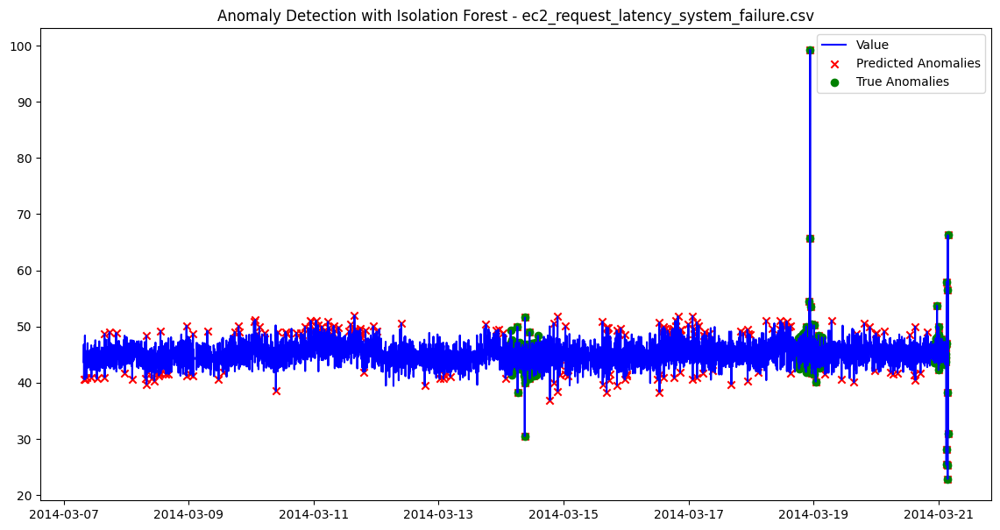

Processing file: machine_temperature_system_failure.csv...
Best F1 Score for machine_temperature_system_failure.csv: 0.5816
Best Parameters: {'contamination': 0.10014571466419393, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


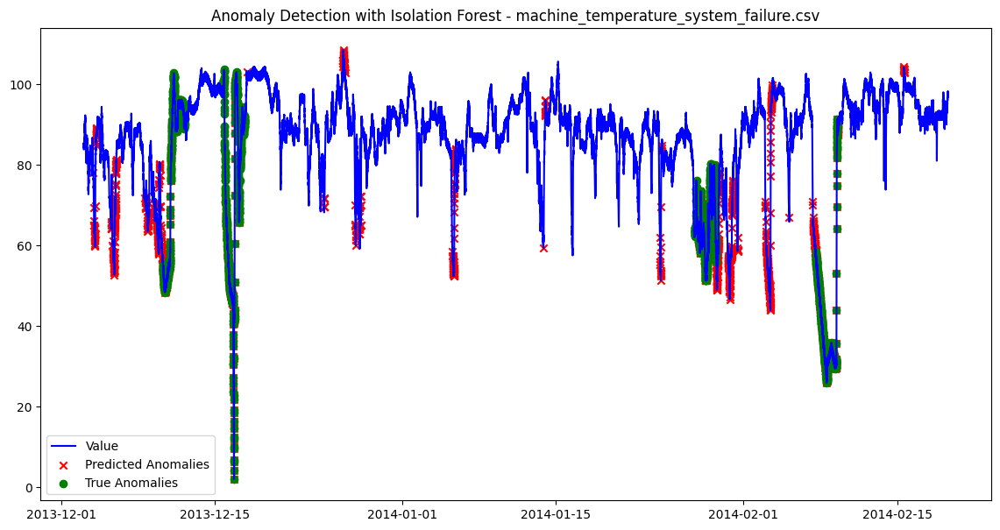

Processing file: rogue_agent_key_hold.csv...
Best F1 Score for rogue_agent_key_hold.csv: 0.0739
Best Parameters: {'contamination': 0.10359869138495092, 'max_samples': 0.75, 'n_estimators': 200, 'random_state': 42}


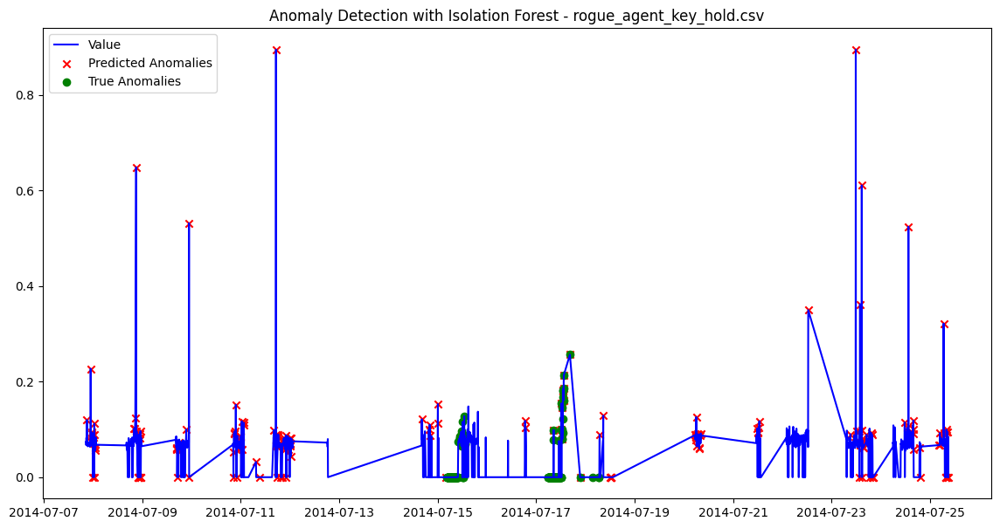

Processing file: rogue_agent_key_updown.csv...
Best F1 Score for rogue_agent_key_updown.csv: 0.0377
Best Parameters: {'contamination': 0.10062654262388457, 'max_samples': 0.5, 'n_estimators': 100, 'random_state': 42}


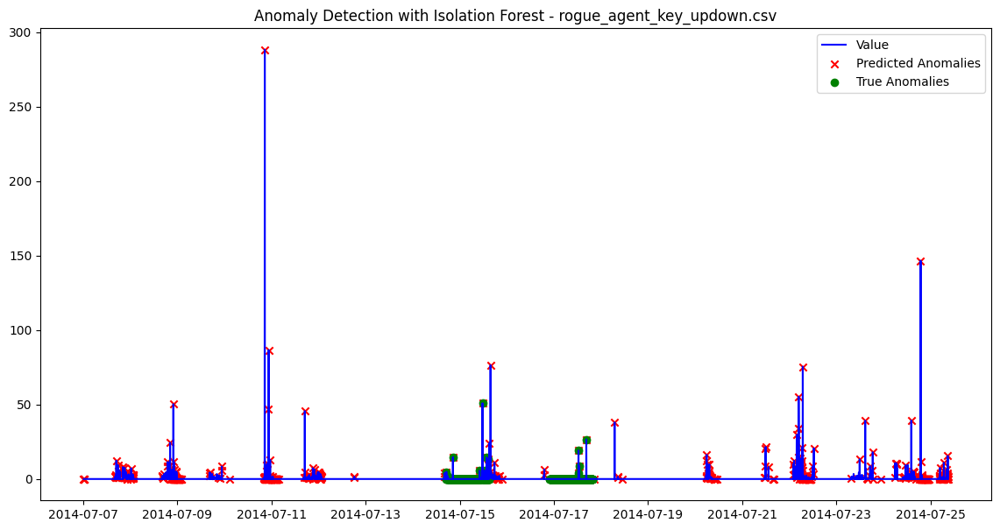

Processing file: ambient_temperature_system_failure.csv...
Best F1 Score for ambient_temperature_system_failure.csv: 0.3251
Best Parameters: {'contamination': 0.10056794569885026, 'max_samples': 'auto', 'n_estimators': 200, 'random_state': 42}


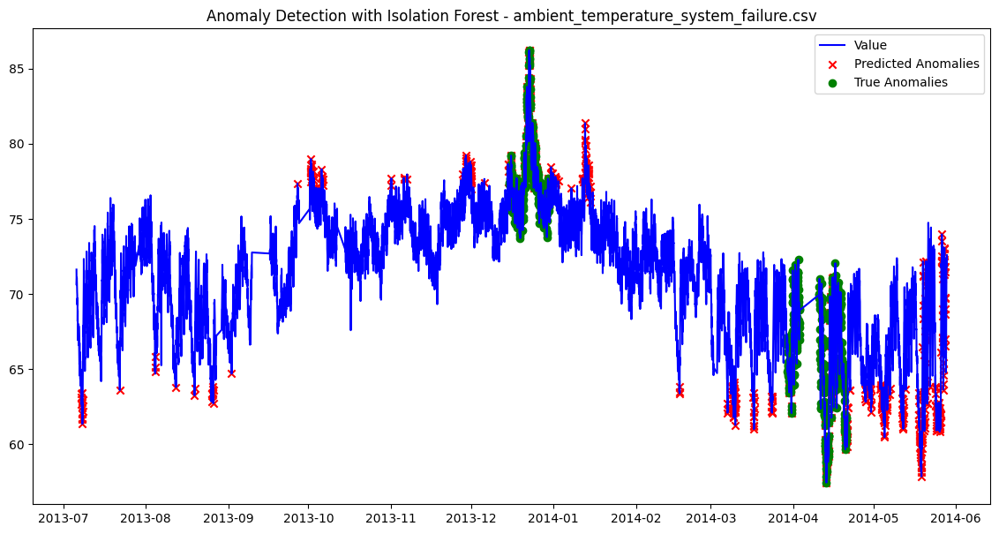

Processing file: cpu_utilization_asg_misconfiguration.csv...
Best F1 Score for cpu_utilization_asg_misconfiguration.csv: 0.5404
Best Parameters: {'contamination': 0.08326852571936451, 'max_samples': 'auto', 'n_estimators': 200, 'random_state': 42}


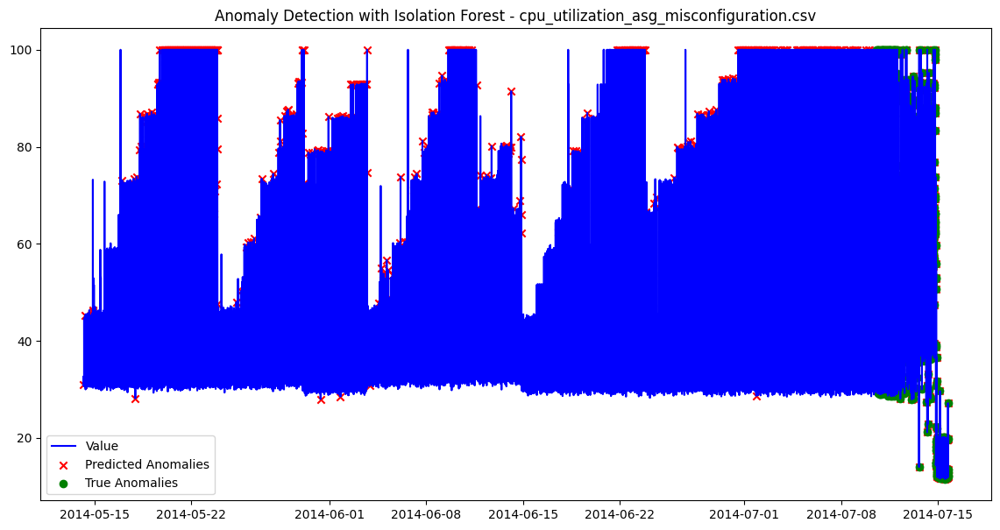

Processing file: nyc_taxi.csv...
Best F1 Score for nyc_taxi.csv: 0.4116
Best Parameters: {'contamination': 0.10075934579439252, 'max_samples': 0.75, 'n_estimators': 50, 'random_state': 42}


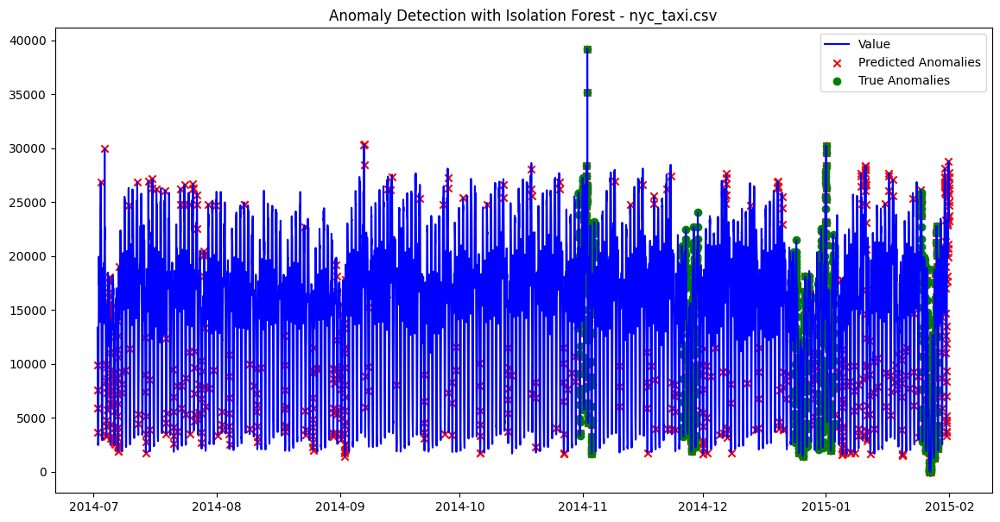

Average F1 Score across all files: 0.3430


In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define ParameterGrid for hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_samples': ['auto', 0.5, 0.75],
    'contamination': ['auto'],
    'random_state': [42]
}
grid = ParameterGrid(param_grid)

# To calculate the F1 scores
f1_scores = []

# Iterate through each CSV file in data['realKnownCause']
for file_name in data['realKnownCause']:
    print(f"Processing file: {file_name}...")

    # Load and perform feature engineering
    data_features = feature_engineering_nab(data['realKnownCause'][file_name], "value", 48)

    # Separate features and labels
    X = data_features.drop("label", axis=1)
    y = data_features['label']

    # Standardize the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
        if params['contamination'] == 'auto':
            params['contamination'] = contamination

        # Train Isolation Forest with current parameters
        isolation_forest = IsolationForest(
            n_estimators=params['n_estimators'],
            max_samples=params['max_samples'],
            contamination=params['contamination'],
            random_state=params['random_state']
        )
        predictions = isolation_forest.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate F1 score
        f1 = f1_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_params = params
            best_predictions = predictions

    # Append best F1 score for the file
    f1_scores.append(best_f1)

    # Output best parameters and F1 score for the current file
    print(f"Best F1 Score for {file_name}: {best_f1:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features['value'], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1]['value'],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1]['value'],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with Isolation Forest - {file_name}')
    plt.legend()
    plt.show()

# Calculate and output the average F1 score
avg_f1_score = sum(f1_scores) / len(f1_scores)
print(f"Average F1 Score across all files: {avg_f1_score:.4f}")


## not temp


Processing file: ec2_request_latency_system_failure.csv...
Best F1 Score for ec2_request_latency_system_failure.csv: 0.1129
Best Precision: 0.1130
Best Recall: 0.1127
Best Parameters: {'contamination': 0.08581349206349206, 'max_samples': 0.75, 'n_estimators': 200, 'random_state': 42}


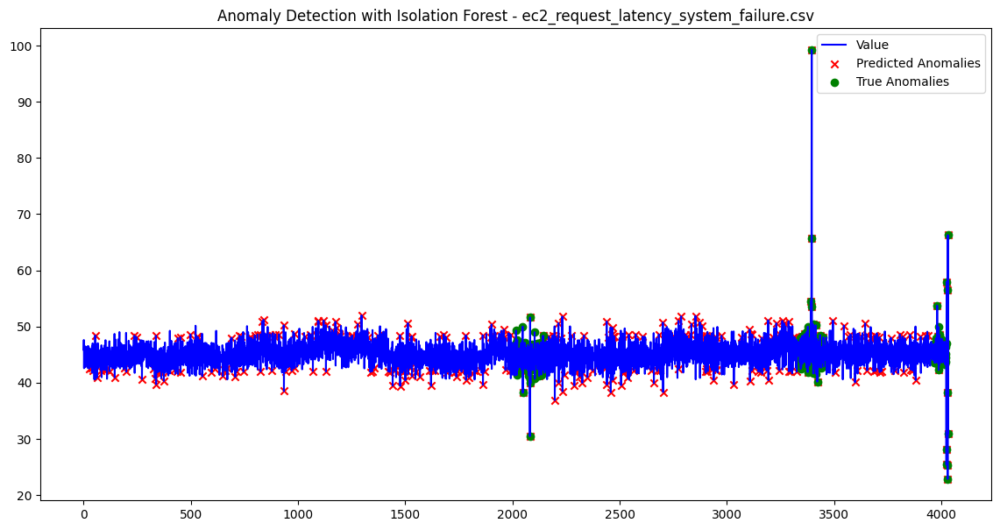

Processing file: machine_temperature_system_failure.csv...
Best F1 Score for machine_temperature_system_failure.csv: 0.4683
Best Precision: 0.4683
Best Recall: 0.4683
Best Parameters: {'contamination': 0.09993390614672835, 'max_samples': 'auto', 'n_estimators': 200, 'random_state': 42}


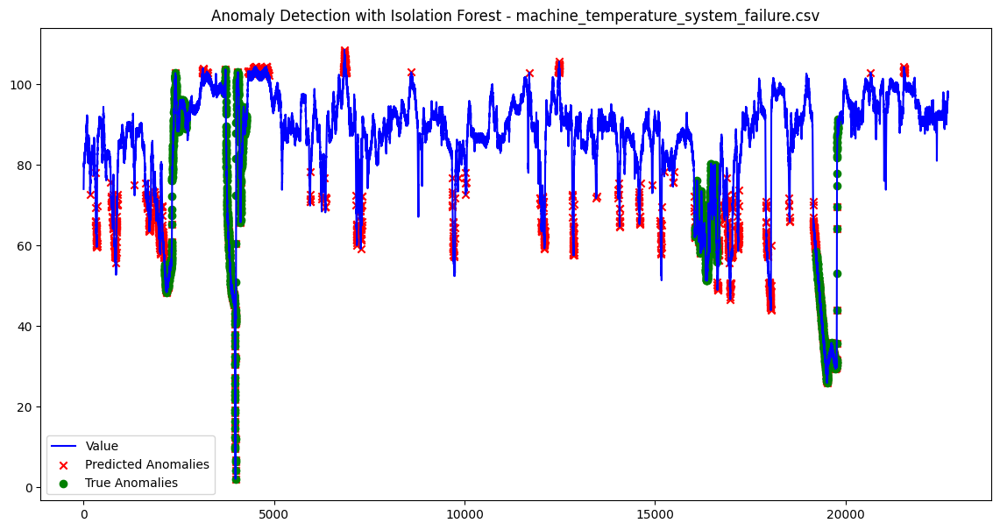

Processing file: rogue_agent_key_hold.csv...
Best F1 Score for rogue_agent_key_hold.csv: 0.1105
Best Precision: 0.1105
Best Recall: 0.1105
Best Parameters: {'contamination': 0.10095642933049948, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


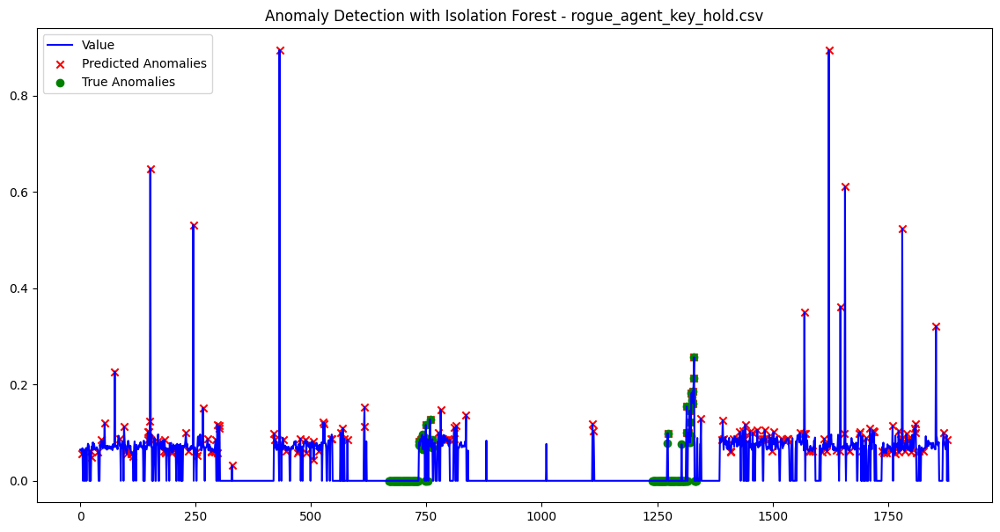

Processing file: rogue_agent_key_updown.csv...


KeyboardInterrupt: 

In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define ParameterGrid for hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_samples': ['auto', 0.5, 0.75],
    'contamination': ['auto'],
    'random_state': [42]
}
grid = ParameterGrid(param_grid)

# To calculate the F1 scores
f1_scores = []
precision_scores = []
recall_scores = []

# Iterate through each CSV file in data['realKnownCause']
for file_name in data['realKnownCause']:
    print(f"Processing file: {file_name}...")

    # Load and perform feature engineering
    data_features = data['realKnownCause'][file_name]

    # Separate features and labels
    X = data_features.drop(["timestamp","label"], axis=1)
    y = data_features['label']

    # Standardize the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_precision = -1
    best_recall = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
        if params['contamination'] == 'auto':
            params['contamination'] = contamination

        # Train Isolation Forest with current parameters
        isolation_forest = IsolationForest(
            n_estimators=params['n_estimators'],
            max_samples=params['max_samples'],
            contamination=params['contamination'],
            random_state=params['random_state']
        )
        predictions = isolation_forest.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate F1 score
        f1 = f1_score(y, predictions)
        precision = precision_score(y, predictions)
        recall = recall_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_params = params
            best_precision = precision
            best_recall = recall
            best_predictions = predictions

    # Append best F1 score for the file
    f1_scores.append(best_f1)

    # Output best parameters and F1 score for the current file
    print(f"Best F1 Score for {file_name}: {best_f1:.4f}")
    print(f"Best Precision: {best_precision:.4f}")
    print(f"Best Recall: {best_recall:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features['value'], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1]['value'],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1]['value'],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with Isolation Forest - {file_name}')
    plt.legend()
    plt.show()

# Calculate and output the average F1 score
avg_f1_score = sum(f1_scores) / len(f1_scores)
avg_precision_score = sum(precision_scores) / len(precision_scores)
avg_recall_score = sum(recall_scores) / len(recall_scores)
print(f"Average F1 Score across all files: {avg_f1_score:.4f}")
print(f"Average Precision Score across all files: {avg_precision_score:.4f}")
print(f"Average Recall Score across all files: {avg_recall_score:.4f}")


## artificial with anomaly

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Perform feature engineering
def feature_engineering_nab(df, value_col, window_size):
    df = df.copy()

    if not isinstance(df.index, pd.DatetimeIndex):
      df['timestamp'] = pd.to_datetime(df['timestamp'])  # Assuming 'timestamp' is the datetime column
      df.set_index('timestamp', inplace=True)

    # Rolling statistics
    df[f'rolling_mean_{window_size}'] = df[value_col].rolling(window=window_size).mean()
    df[f'rolling_std_{window_size}'] = df[value_col].rolling(window=window_size).std()
    df[f'rolling_min_{window_size}'] = df[value_col].rolling(window=window_size).min()
    df[f'rolling_max_{window_size}'] = df[value_col].rolling(window=window_size).max()

    # Time-based features
    df['hour'] = df.index.hour
    df['day_of_week'] = df.index.dayofweek
    df['day_of_month'] = df.index.day
    df['month'] = df.index.month
    df['Lag'] = df[value_col].shift(288)

    # Sinusoidal encoding for seasonality
    df['sin_day'] = np.sin(2 * np.pi * df.index.dayofyear / 288)
    df['cos_day'] = np.cos(2 * np.pi * df.index.dayofyear / 288)

    # Drop rows with NaN due to rolling statistics
    df.dropna(inplace=True)
    return df

## temp

Processing file: art_daily_flatmiddle.csv...
3744
403
Best F1 Score for art_daily_flatmiddle.csv: 0.1737
Best Parameters: {'contamination': 0.1076388888888889, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 100, 'random_state': 42}


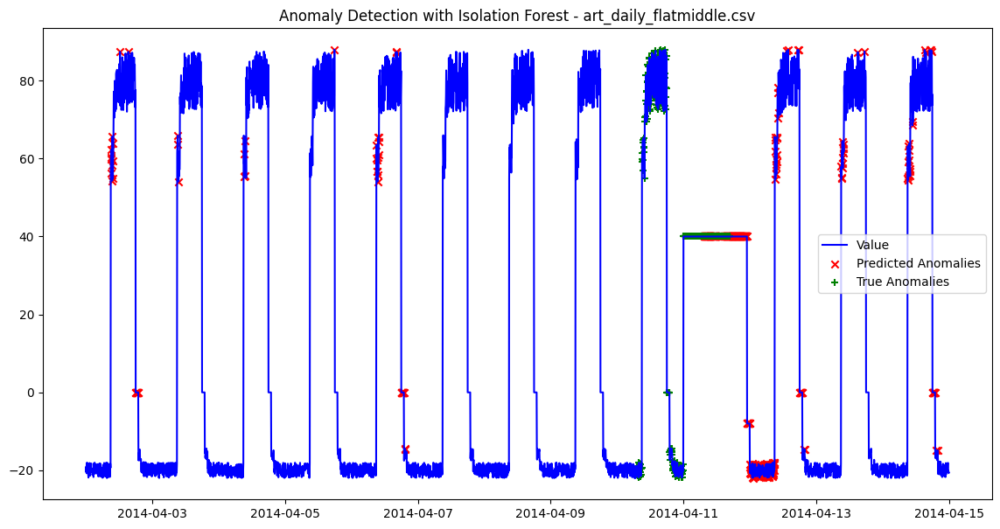

Processing file: art_daily_nojump.csv...
3744
403
Best F1 Score for art_daily_nojump.csv: 0.3375
Best Parameters: {'contamination': 0.1076388888888889, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 200, 'random_state': 42}


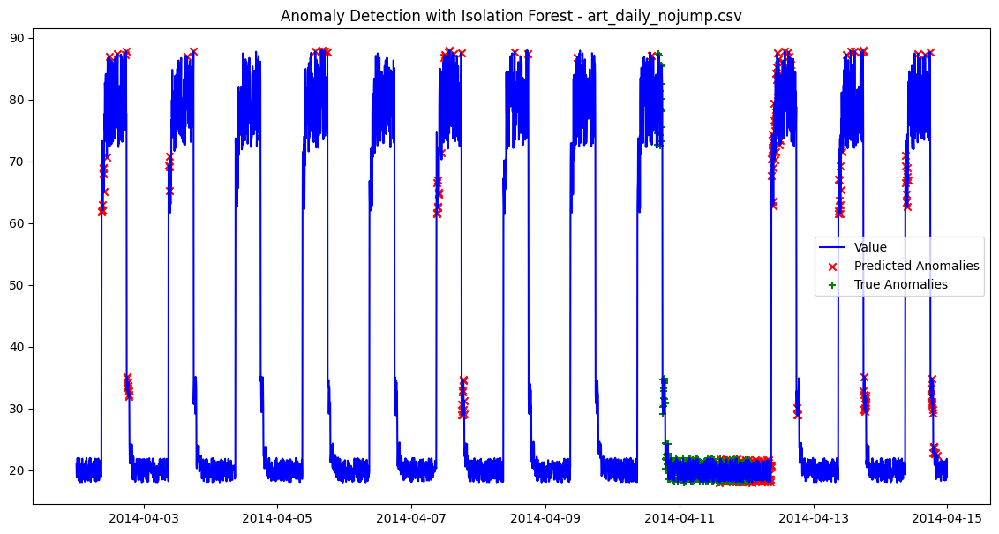

Processing file: art_load_balancer_spikes.csv...
3744
403
Best F1 Score for art_load_balancer_spikes.csv: 0.2754
Best Parameters: {'contamination': 0.1076388888888889, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


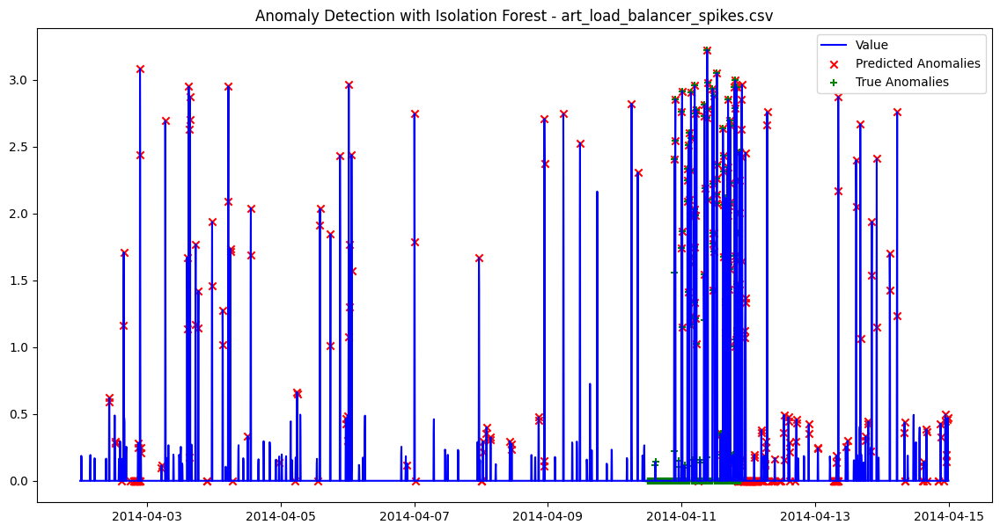

Processing file: art_daily_jumpsup.csv...
3744
403
Best F1 Score for art_daily_jumpsup.csv: 0.5012
Best Parameters: {'contamination': 0.1076388888888889, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


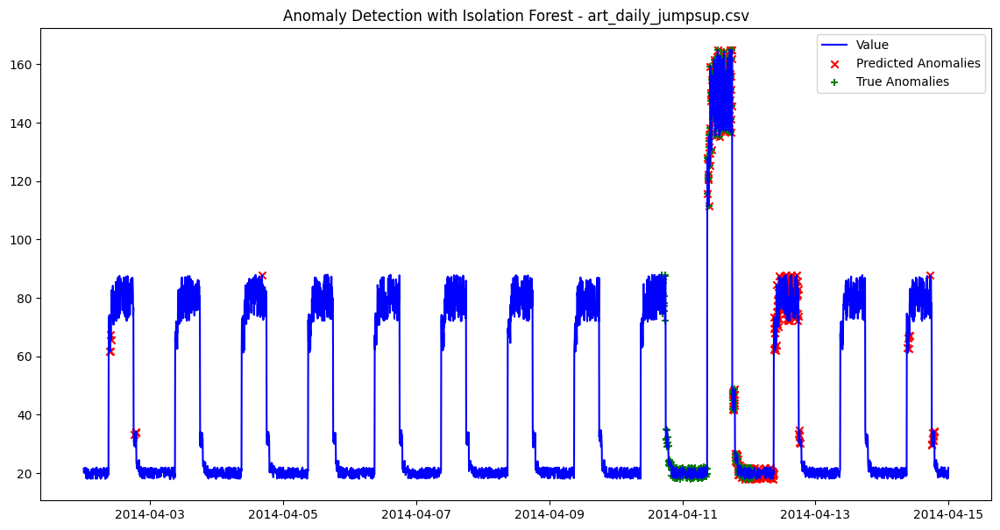

Processing file: art_daily_jumpsdown.csv...
3744
403
Best F1 Score for art_daily_jumpsdown.csv: 0.3623
Best Parameters: {'contamination': 0.1076388888888889, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 200, 'random_state': 42}


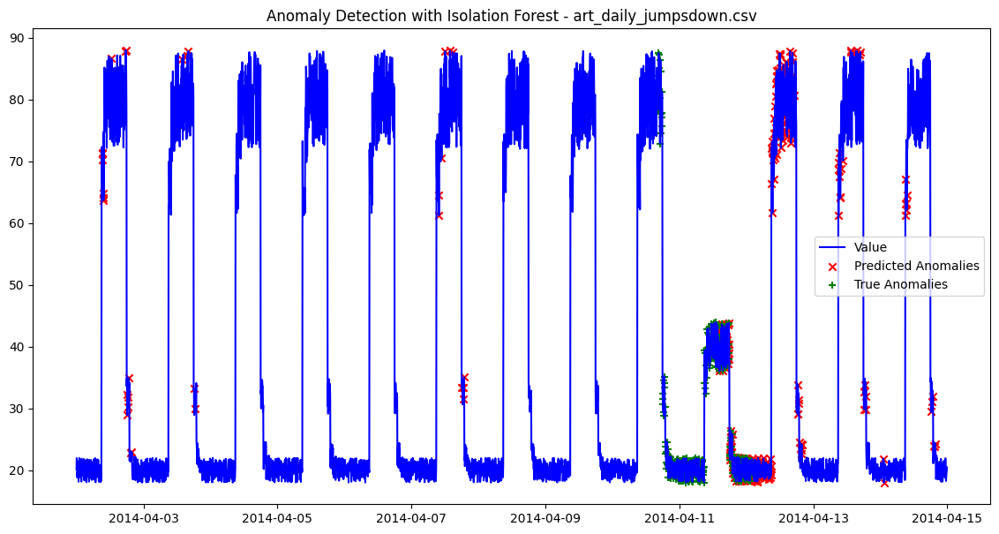

Processing file: art_increase_spike_density.csv...
3744
403
Best F1 Score for art_increase_spike_density.csv: 0.1445
Best Parameters: {'contamination': 0.1076388888888889, 'max_features': 12, 'max_samples': 'auto', 'n_estimators': 100, 'random_state': 42}


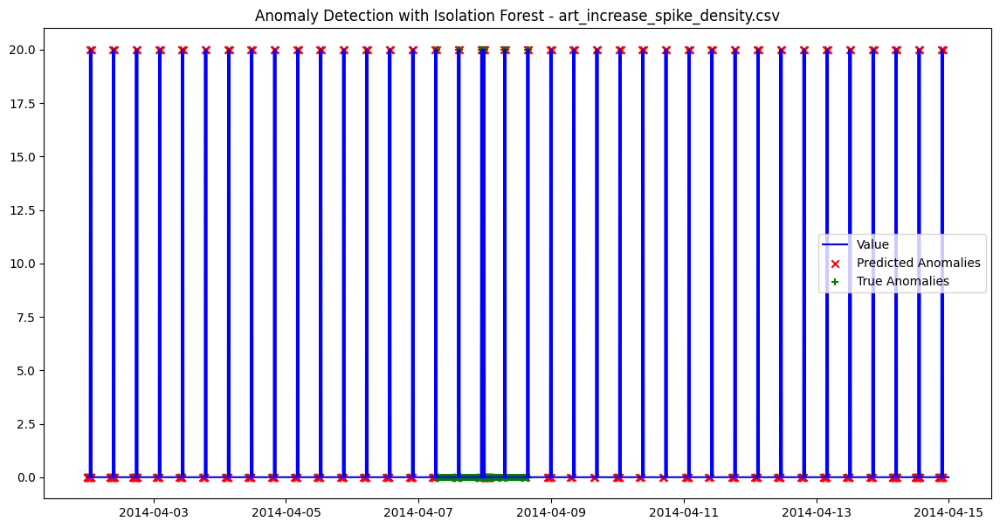

Average F1 Score across all files: 0.2991


In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define ParameterGrid for hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_samples': ['auto', 0.5, 0.75],
    'contamination': ['auto'],
    'max_features': [12],
    'random_state': [42]
}
grid = ParameterGrid(param_grid)

# To calculate the F1 scores
f1_scores = []

# Iterate through each CSV file in data['realKnownCause']
for file_name in data['artificialWithAnomaly']:
    print(f"Processing file: {file_name}...")

    # Load and perform feature engineering
    data_features = feature_engineering_nab(data['artificialWithAnomaly'][file_name], "value", 288)

    # Separate features and labels
    X = data_features.drop("label", axis=1)
    y = data_features['label']
    print(len(y))
    print(y.sum())
    # Standardize the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
        if params['contamination'] == 'auto':
            params['contamination'] = contamination

        # Train Isolation Forest with current parameters
        isolation_forest = IsolationForest(
            n_estimators=params['n_estimators'],
            max_samples=params['max_samples'],
            contamination=params['contamination'],
            max_features=params["max_features"],
            random_state=params['random_state']
        )
        predictions = isolation_forest.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate F1 score
        f1 = f1_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_params = params
            best_predictions = predictions

    # Append best F1 score for the file
    f1_scores.append(best_f1)

    # Output best parameters and F1 score for the current file
    print(f"Best F1 Score for {file_name}: {best_f1:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features['value'], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1]['value'],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1]['value'],
                color='green', label='True Anomalies', marker='+')

    plt.title(f'Anomaly Detection with Isolation Forest - {file_name}')
    plt.legend()
    plt.show()

# Calculate and output the average F1 score
avg_f1_score = sum(f1_scores) / len(f1_scores)
print(f"Average F1 Score across all files: {avg_f1_score:.4f}")


## not temp

Processing file: art_daily_flatmiddle.csv...
Best F1 Score for art_daily_flatmiddle.csv: 0.0943
Best Parameters: {'contamination': 0.09995039682539683, 'max_samples': 'auto', 'n_estimators': 200, 'random_state': 42}


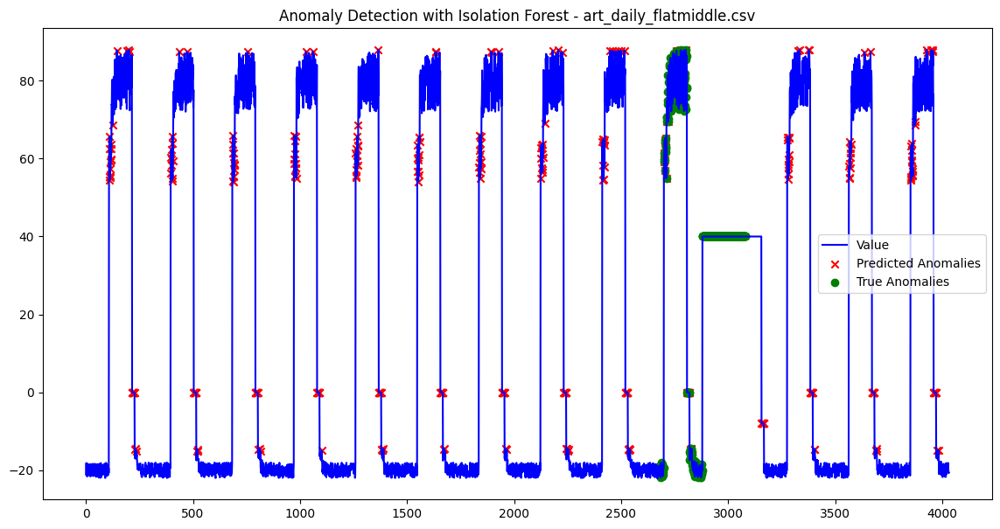

Processing file: art_daily_nojump.csv...
Best F1 Score for art_daily_nojump.csv: 0.0447
Best Parameters: {'contamination': 0.09995039682539683, 'max_samples': 0.75, 'n_estimators': 50, 'random_state': 42}


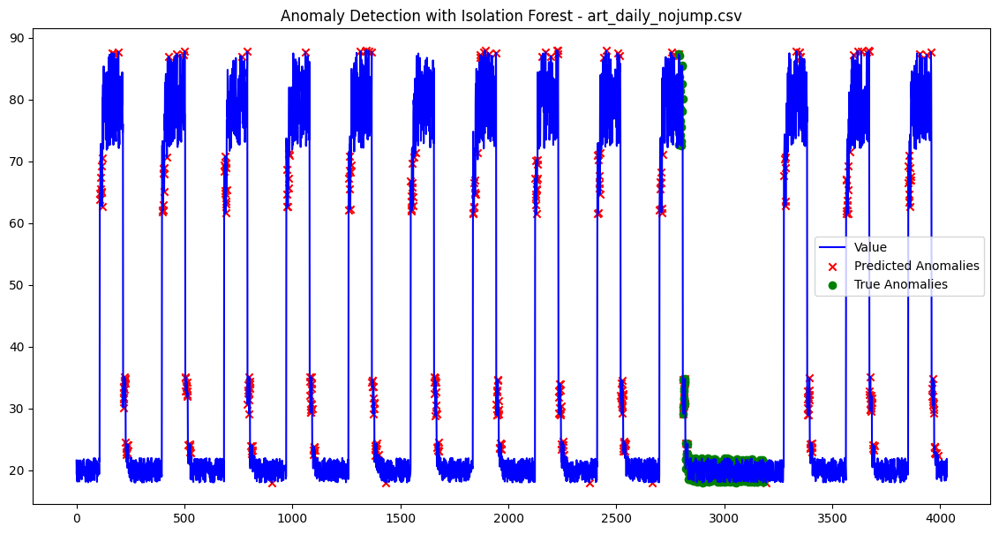

Processing file: art_load_balancer_spikes.csv...
Best F1 Score for art_load_balancer_spikes.csv: 0.2758
Best Parameters: {'contamination': 0.09995039682539683, 'max_samples': 0.5, 'n_estimators': 50, 'random_state': 42}


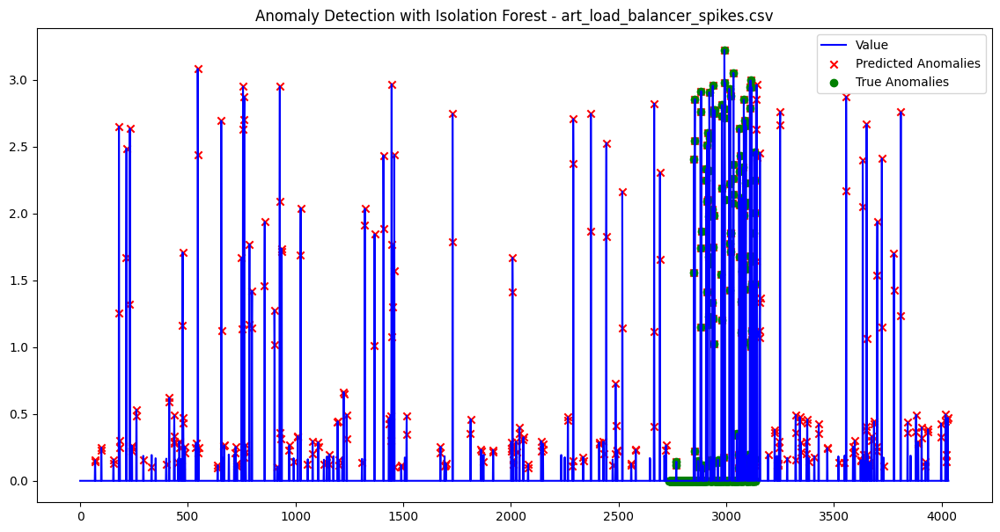

Processing file: art_daily_jumpsup.csv...
Best F1 Score for art_daily_jumpsup.csv: 0.3623
Best Parameters: {'contamination': 0.09995039682539683, 'max_samples': 0.5, 'n_estimators': 100, 'random_state': 42}


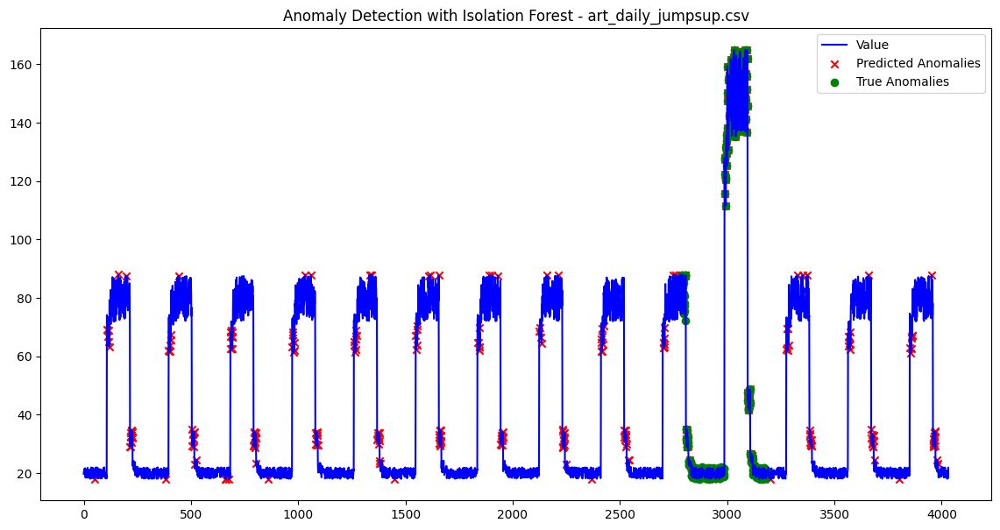

Processing file: art_daily_jumpsdown.csv...
Best F1 Score for art_daily_jumpsdown.csv: 0.3102
Best Parameters: {'contamination': 0.09995039682539683, 'max_samples': 0.75, 'n_estimators': 50, 'random_state': 42}


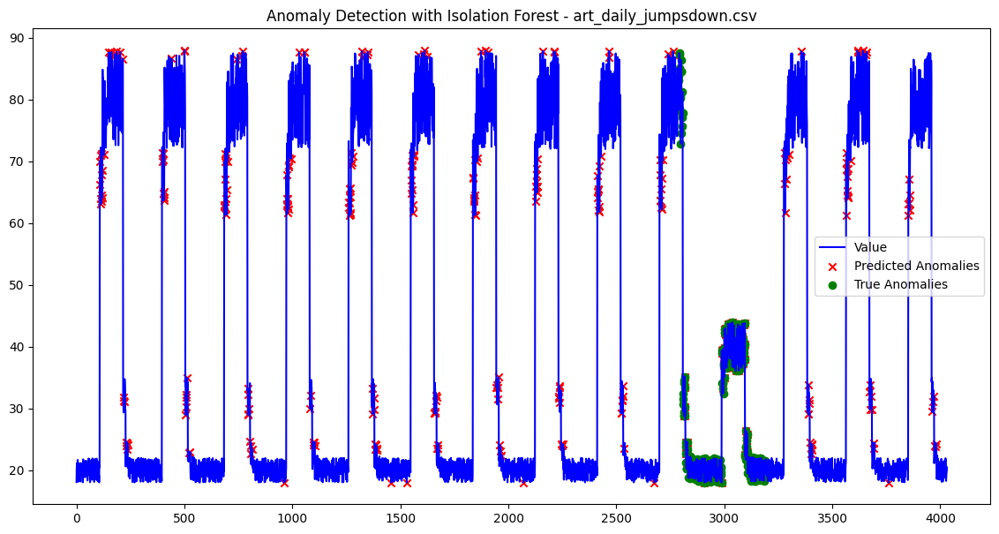

Processing file: art_increase_spike_density.csv...
Best F1 Score for art_increase_spike_density.csv: 0.0492
Best Parameters: {'contamination': 0.09995039682539683, 'max_samples': 'auto', 'n_estimators': 50, 'random_state': 42}


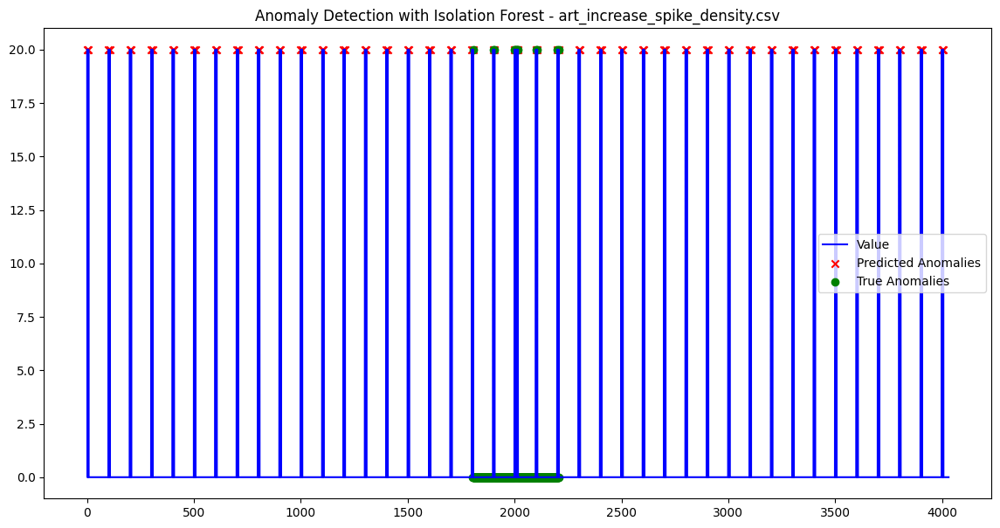

Average F1 Score across all files: 0.1894


In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score
from sklearn.model_selection import ParameterGrid
import matplotlib.pyplot as plt
import pandas as pd

# Define ParameterGrid for hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_samples': ['auto', 0.5, 0.75],
    'contamination': ['auto'],
    'random_state': [42]
}
grid = ParameterGrid(param_grid)

# To calculate the F1 scores
f1_scores = []

# Iterate through each CSV file in data['realKnownCause']
for file_name in data['artificialWithAnomaly']:
    print(f"Processing file: {file_name}...")

    # Load and perform feature engineering
    data_features = data['artificialWithAnomaly'][file_name]

    # Separate features and labels
    X = data_features.drop(["timestamp","label"], axis=1)
    y = data_features['label']

    # Standardize the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Estimate contamination
    contamination = y.sum() / len(y)

    # Hyperparameter tuning using grid search
    best_f1 = -1
    best_params = None
    best_predictions = None

    for params in grid:
        # Update contamination dynamically if it's 'auto'
        if params['contamination'] == 'auto':
            params['contamination'] = contamination

        # Train Isolation Forest with current parameters
        isolation_forest = IsolationForest(
            n_estimators=params['n_estimators'],
            max_samples=params['max_samples'],
            contamination=params['contamination'],
            random_state=params['random_state']
        )
        predictions = isolation_forest.fit_predict(X_scaled)

        # Map predictions to binary (1 = anomaly, 0 = normal)
        predictions = [1 if pred == -1 else 0 for pred in predictions]

        # Calculate F1 score
        f1 = f1_score(y, predictions)

        # Update best parameters if current F1 is better
        if f1 > best_f1:
            best_f1 = f1
            best_params = params
            best_predictions = predictions

    # Append best F1 score for the file
    f1_scores.append(best_f1)

    # Output best parameters and F1 score for the current file
    print(f"Best F1 Score for {file_name}: {best_f1:.4f}")
    print(f"Best Parameters: {best_params}")

    # Add predictions to the original DataFrame for inspection
    data_features['predictions'] = best_predictions

    # Visualize anomalies
    plt.figure(figsize=(14, 7))
    plt.plot(data_features.index, data_features['value'], label='Value', color='blue')
    plt.scatter(data_features[data_features['predictions'] == 1].index,
                data_features[data_features['predictions'] == 1]['value'],
                color='red', label='Predicted Anomalies', marker='x')
    plt.scatter(data_features[data_features['label'] == 1].index,
                data_features[data_features['label'] == 1]['value'],
                color='green', label='True Anomalies', marker='o')

    plt.title(f'Anomaly Detection with Isolation Forest - {file_name}')
    plt.legend()
    plt.show()

# Calculate and output the average F1 score
avg_f1_score = sum(f1_scores) / len(f1_scores)
print(f"Average F1 Score across all files: {avg_f1_score:.4f}")
